# Análisis de Patrones Migratorios y Factores Socioeconómicos en Comunas de Chile

---

## Resumen

Este proyecto analiza los patrones de **emigración e inmigración** en las comunas de Chile durante el período 2018-2023, evaluando la influencia de variables como:
- Población
- Densidad poblacional
- PIB per cápita
- Indicadores macroeconómicos nacionales

### Objetivos del Estudio

1. **Identificar** las variables socioeconómicas que mejor predicen los flujos migratorios
2. **Construir** modelos predictivos de emigración e inmigración
3. **Comparar** el rendimiento de diferentes algoritmos de Machine Learning
4. **Analizar** la importancia relativa de cada variable.

### Metodología

- **Fuentes de datos:** Datos de migración comunal y estadísticas macroeconómicas de Chile
- **Técnicas aplicadas:**
  - Análisis Exploratorio de Datos (EDA)
  - Transformación de datos (Yeo-Johnson)
  - Normalización (Z-score)
  - Análisis de Componentes Principales (PCA)
  - Regresión polinomial
  - Random Forest
  - Gradient Boosting

In [ ]:
!pip install pandas matplotlib seaborn scikit-learn jupyterlab ipywidgets
!pip install ydata-profiling openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.8/59.8 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 29.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 398.7/398.7 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 59.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 31.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 3.4 MB/s eta 0:00:00


### 2.2 Lectura de Archivos

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
# OJO, este zip contiene los 3 archivos de emigracion, inmigracion y macroeconomicos que estan en el drive en procesado/finales
# !unzip "drive-download-20251011T214753Z-1-001.zip"

### 2.3 Integración de Datos

Combinamos los tres conjuntos de datos en un único DataFrame, asegurando la consistencia de las variables y eliminando duplicados.

De manera similar al modelo de emigración, los **coeficientes del modelo de inmigración** muestran la **relación entre cada característica y la inmigración predicha** (en Z-score), asumiendo que las demás variables se mantienen constantes.

Según los resultados obtenidos:

* **Población** presenta el **coeficiente positivo más alto (0.8003)**, lo que sugiere que las áreas más pobladas están asociadas con una **mayor inmigración**.
* **PIB per cápita (USD)** tiene un **coeficiente positivo (0.5354)**, indicando que las zonas con un mayor PIB per cápita tienden a tener **mayor inmigración**.
* **PIB (millones USD, últimos 12 meses)** muestra un **coeficiente positivo (0.1430)**, lo que sugiere una **relación positiva** entre la actividad económica total y la inmigración.
* **Densidad** tiene un **coeficiente positivo (0.1376)**, indicando que las áreas más densamente pobladas también podrían experimentar **más inmigración**.
* **Población país** posee un **coeficiente negativo (-0.3647)**, lo que sugiere que una mayor población nacional está asociada con **menor inmigración** en una comuna determinada.
* **PIB per cápita** muestra un **coeficiente negativo (-0.7306)**. Nuevamente, los **signos opuestos y magnitudes similares** entre *“PIB per cápita (USD)”* y *“PIB per cápita”* esto confirma la **multicolinealidad** o **diferencias de escala** que se pudo ver en la matriz de correlación anteriormente.

**Vista preliminar del dataset integrado:**

In [ ]:
df_emigracion = pd.read_excel("/content/Emigracion_poblacion_normalizado.xlsx")
df_inmigracion = pd.read_excel("/content/Inmigracion_poblacion_normalizado.xlsx")
df_macro = pd.read_excel("/content/indicadores_macroecon_promedio_anual.xlsx")

---

## 3. Análisis Exploratorio de Datos (EDA)

### 3.1 Perfil Automatizado con ydata-profiling

Utilizamos `ydata-profiling` para generar un informe completo de las características de nuestro dataset, incluyendo:
- Estadísticas descriptivas
- Distribuciones de variables
- Correlaciones (Pearson y Spearman)
- Valores faltantes y duplicados

In [ ]:
df_arr = [df_emigracion, df_inmigracion, df_macro]
for _i in range(len(df_arr)):
  print(df_arr[_i].head())

            comuna  emigracion  poblacion  densidad   año
0            Alhué        1406       7022       8.3  2018
1             Buin       12417     104338     487.6  2018
2  Calera de Tango       17367      27309     372.6  2018
3        Cerrillos       18418      86451    4116.7  2018
4      Cerro Navia       26375     140355   12759.5  2018
            comuna   año  inmigracion  poblacion
0            Alhué  2018         1831       7022
1             Buin  2018        26102     104338
2  Calera de Tango  2018         9775      27309
3        Cerrillos  2018        19363      86451
4      Cerro Navia  2018        22052     140355
   PIB (millones USD, últimos 12 meses)   poblacion pais  PIB per capita  \
0                            265292.0950        17919192        0.014805   
1                            295027.2925        18251405        0.016165   
2                            285082.0450        18607216        0.015321   
3                            256655.1875        189583

In [ ]:
# --- LIMPIAR COLUMNAS ---
df_emigracion.columns = df_emigracion.columns.str.strip()
df_inmigracion.columns = df_inmigracion.columns.str.strip()
df_macro.columns = df_macro.columns.str.strip()

# --- MERGE ENTRE EMIGRACION E INMIGRACION ---
df_emig_inmig = pd.merge(
    df_emigracion,
    df_inmigracion[['comuna', 'año', 'inmigracion']],
    on=['comuna', 'año'],
    how='left'
)

# --- ELIMINAR COLUMNAS DUPLICADAS DE MACRO ---
cols_repetidas = [c for c in df_macro.columns if c in df_emig_inmig.columns and c != 'año']
df_macro_filtrado = df_macro.drop(columns=cols_repetidas)

# --- MERGE FINAL ---
df_final = pd.merge(
    df_emig_inmig,
    df_macro_filtrado,
    on='año',
    how='left'
)

# --- LIMPIEZA FINAL ---
df_final = df_final.loc[:, ~df_final.columns.duplicated()]
df_final = df_final.rename(columns=lambda c: c.replace('_x', '').replace('_y', ''))

print(df_final.head())


            comuna  emigracion  poblacion  densidad   año  inmigracion  \
0            Alhué        1406       7022       8.3  2018         1831   
1             Buin       12417     104338     487.6  2018        26102   
2  Calera de Tango       17367      27309     372.6  2018         9775   
3        Cerrillos       18418      86451    4116.7  2018        19363   
4      Cerro Navia       26375     140355   12759.5  2018        22052   

   PIB (millones USD, últimos 12 meses)  poblacion pais  PIB per capita  \
0                           295027.2925        18251405        0.016165   
1                           295027.2925        18251405        0.016165   
2                           295027.2925        18251405        0.016165   
3                           295027.2925        18251405        0.016165   
4                           295027.2925        18251405        0.016165   

   PIB per capita (USD)  
0           16164.63459  
1           16164.63459  
2           16164.63459  


In [ ]:
# --- LIMPIAR NOMBRES ---
df_final.columns = (
    df_final.columns
    .str.replace(r'\s+', ' ', regex=True)  # elimina espacios invisibles como \xa0
    .str.strip()                           # quita espacios al inicio/final
)

# --- ELIMINAR COLUMNAS DUPLICADAS ---
df_final = df_final.loc[:, ~df_final.columns.duplicated()]

# --- (OPCIONAL) REORDENAR COLUMNAS ---
columnas_orden = [
    'comuna', 'año', 'emigracion', 'inmigracion', 'poblacion', 'densidad',
    'PIB (millones USD, últimos 12 meses)', 'PIB per capita', 'PIB per capita (USD)', 'poblacion pais'
]
# Filtra solo las columnas que existen (por si alguna no está)
df_final = df_final[[c for c in columnas_orden if c in df_final.columns]]

# --- VISTA FINAL ---
print(df_final.head())


            comuna   año  emigracion  inmigracion  poblacion  densidad  \
0            Alhué  2018        1406         1831       7022       8.3   
1             Buin  2018       12417        26102     104338     487.6   
2  Calera de Tango  2018       17367         9775      27309     372.6   
3        Cerrillos  2018       18418        19363      86451    4116.7   
4      Cerro Navia  2018       26375        22052     140355   12759.5   

   PIB (millones USD, últimos 12 meses)  PIB per capita  PIB per capita (USD)  \
0                           295027.2925        0.016165           16164.63459   
1                           295027.2925        0.016165           16164.63459   
2                           295027.2925        0.016165           16164.63459   
3                           295027.2925        0.016165           16164.63459   
4                           295027.2925        0.016165           16164.63459   

   poblacion pais  
0        18251405  
1        18251405  
2       

In [ ]:
# Exportar el DataFrame a Excel
df_final.to_excel("final.xlsx", index=False)


## 4. Preprocesamiento y Transformación de Datos

### 4.1 Transformación Yeo-Johnson

Aplicamos la **transformación Yeo-Johnson** para normalizar las distribuciones de las variables y reducir el efecto de outliers. Esta transformación es similar a Box-Cox pero puede manejar valores negativos y cero.

In [ ]:
# %pip install ydata-profiling openpyxl

from ydata_profiling import ProfileReport

# Generar el informe (incluye correlaciones solicitadas)
profile = ProfileReport(
	df_final,
	explorative=True,
	title="EDA - Comunas",
	correlations={"pearson": {"calculate": True}, "spearman": {"calculate": True}}
)

# (Opcional) Guardar en un archivo HTML
# profile.to_file("EDA_report.html")

# Mostrar en Jupyter Notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 10/10 [00:00<00:00, 164.38it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Verificación de Z-Scores después de la transformación:**

In [ ]:
# Select only numerical columns for boxplot
df_numerical_final = df_final.select_dtypes(include=np.number)

# Get the list of numerical column names
numerical_cols = df_numerical_final.columns

# iterate over each numerical column of df_final to make the boxplot
for i, col in enumerate(numerical_cols):

    print('Media', df_numerical_final[col].mean())
    print('Desv. Estandar', df_numerical_final[col].std())
    z_score = (df_numerical_final[col] - df_numerical_final[col].mean()) / df_numerical_final[col].std()
    print('Z-Score', z_score)
    df_numerical_final['df_zscore'] = z_score


Media 2020.5
Desv. Estandar 1.7105686236094624
Z-Score 0     -1.461502
1     -1.461502
2     -1.461502
3     -1.461502
4     -1.461502
         ...   
307    1.461502
308    1.461502
309    1.461502
310    1.461502
311    1.461502
Name: año, Length: 312, dtype: float64
Media 21408.48717948718
Desv. Estandar 20938.416422825652
Z-Score 0     -0.955301
1     -0.429425
2     -0.193018
3     -0.142823
4      0.237196
         ...   
307   -0.600164
308    1.786024
309   -0.748743
310   -0.994941
311   -0.543140
Name: emigracion, Length: 312, dtype: float64
Media 21408.48717948718
Desv. Estandar 18238.425398479783
Z-Score 0     -1.073420
1      0.257342
2     -0.637856
3     -0.112153
4      0.035283
         ...   
307   -0.799547
308    2.049766
309   -0.865562
310   -1.145301
311   -0.557970
Name: inmigracion, Length: 312, dtype: float64
Media 155975.625
Desv. Estandar 134821.7964144344
Z-Score 0     -1.104819
1     -0.383007
2     -0.954346
3     -0.515678
4     -0.115861
         ...   

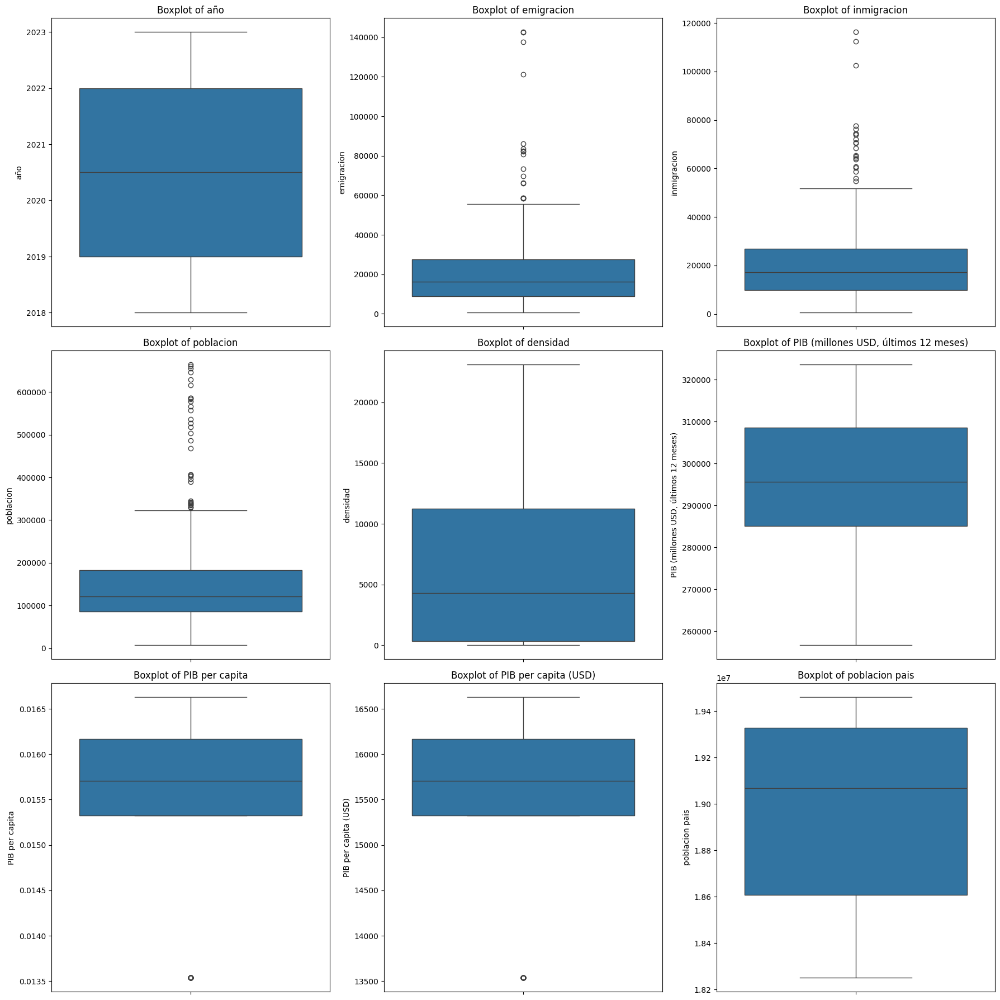

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

%matplotlib inline
# Select only numerical columns for boxplot
df_numerical_final = df_final.select_dtypes(include=np.number)

# Get the list of numerical column names
numerical_cols = df_numerical_final.columns

# Determine the number of rows and columns for subplots
n_cols = 3  # You can adjust the number of columns as needed
n_rows = (len(numerical_cols) + n_cols - 1) // n_cols

# Crear una figura con subgráficos
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# iterate over each numerical column of df_final to make the boxplot
for i, col in enumerate(numerical_cols):
    sns.boxplot(y=df_numerical_final[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_ylabel(col) # Set y-label to the column name

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


plt.tight_layout()  # Ajusta los subgráficos para que no se sobrepongan
plt.show()

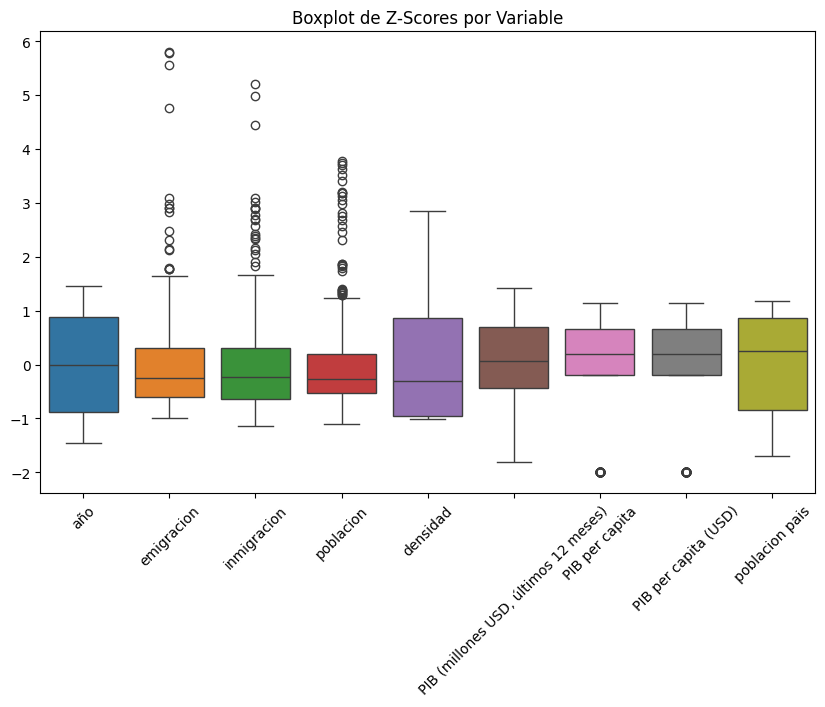

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Crea un DataFrame solo con los Z-scores de cada variable
df_z = (df_numerical_final - df_numerical_final.mean()) / df_numerical_final.std()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_z)
plt.title("Boxplot de Z-Scores por Variable")
plt.xticks(rotation=45)
plt.show()


### 4.2 Validación Post-Transformación

Generamos un nuevo perfil de datos para verificar la efectividad de la transformación Yeo-Johnson:

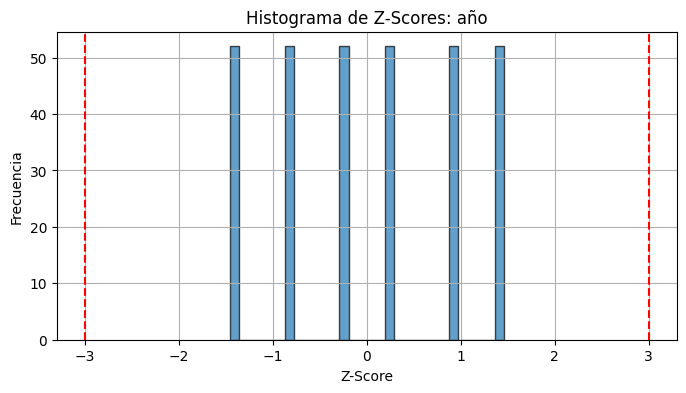

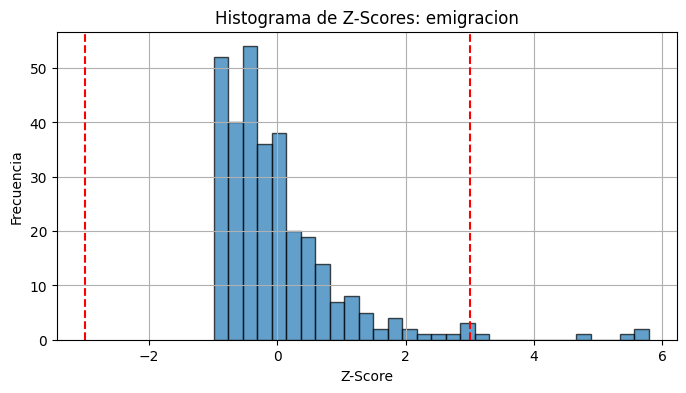

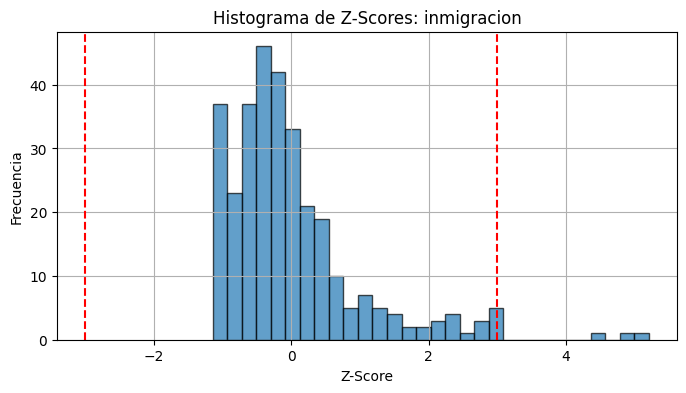

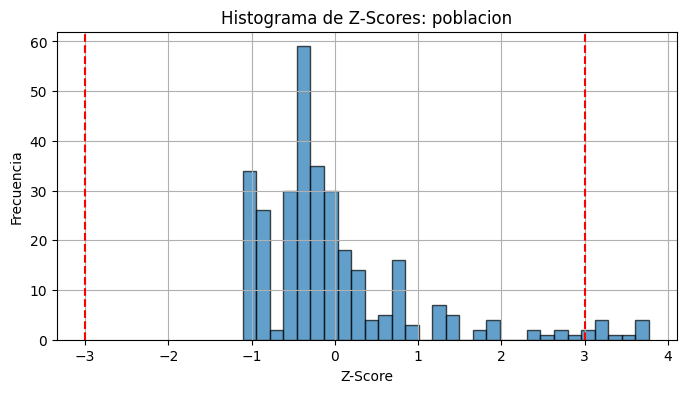

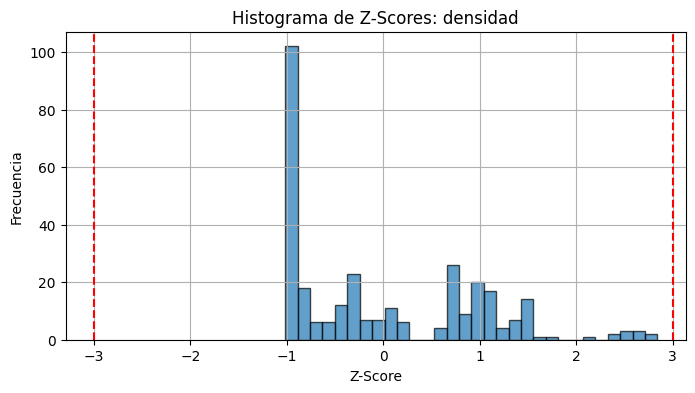

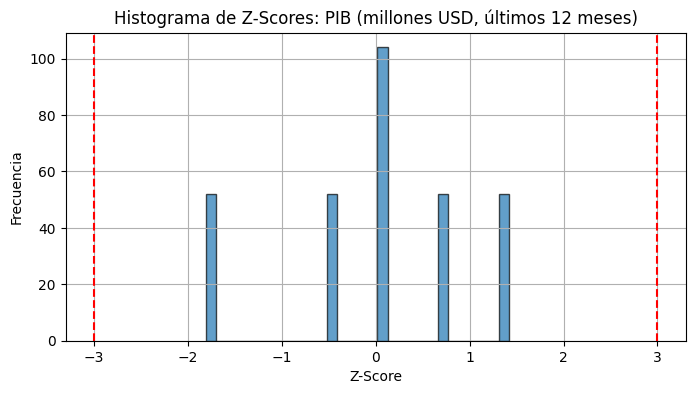

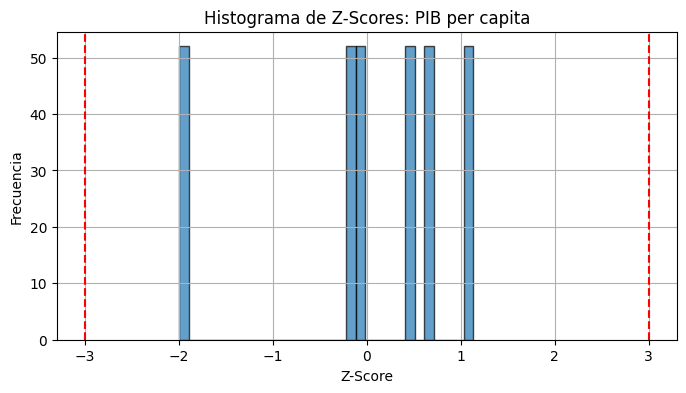

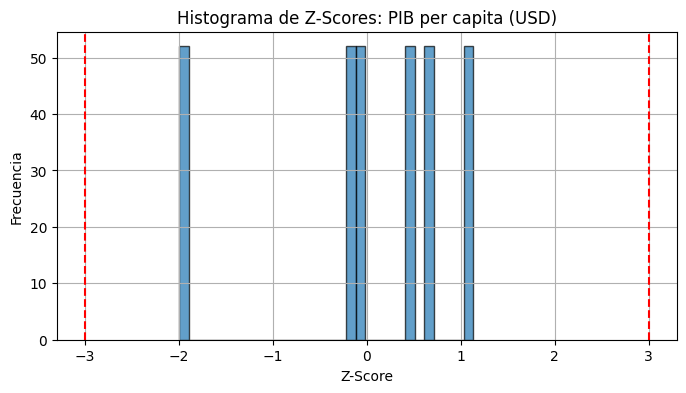

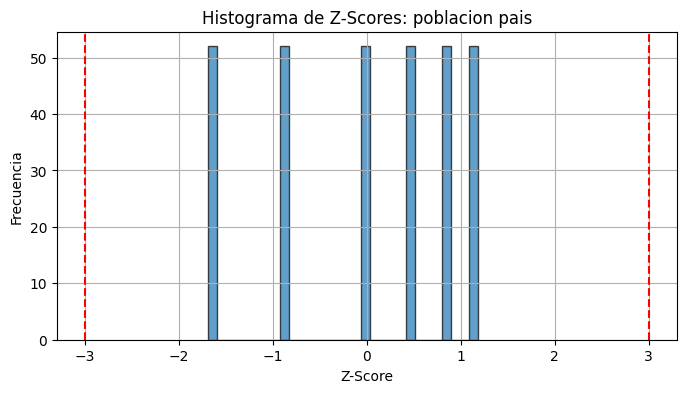

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
for col in df_z.columns:
    plt.figure(figsize=(8, 4))
    plt.hist(df_z[col], bins=30, edgecolor='k', alpha=0.7)
    plt.axvline(x=-3, color='red', linestyle='--', label='-3Z')
    plt.axvline(x=3, color='red', linestyle='--', label='+3Z')
    plt.title(f'Histograma de Z-Scores: {col}')
    plt.xlabel('Z-Score')
    plt.ylabel('Frecuencia')
    plt.grid(True)
    plt.show()


### 4.3 Escalado de Datos

Aplicamos dos técnicas de escalado para preparar los datos para el modelado:

- **MinMax Scaling:** Normaliza los valores entre 0 y 1
- **Z-Score Scaling (StandardScaler):** Estandariza con media 0 y desviación estándar 1 (utilizaremos este)

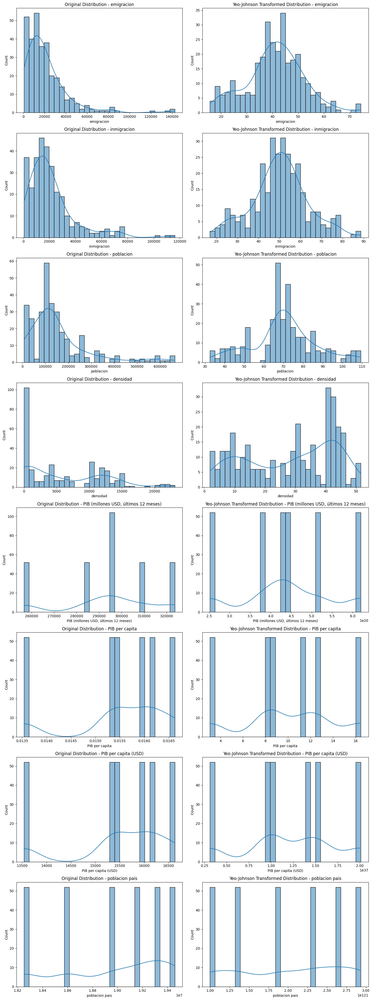

In [ ]:
from scipy.stats import yeojohnson
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

%matplotlib inline
# Select only numerical columns for Yeo-Johnson transformation, excluding 'año'
df_numerical = df_final.select_dtypes(include=np.number).drop(columns=['año'])

# Apply Yeo-Johnson transformation to each numerical column
df_transformed = pd.DataFrame()
for col in df_numerical.columns:
    df_transformed[col], _ = yeojohnson(df_numerical[col])

# Visualizamos las distribuciones
fig, axes = plt.subplots(len(df_numerical.columns), 2, figsize=(15, 5 * len(df_numerical.columns)))

for i, col in enumerate(df_numerical.columns):
    # Plot original distributions
    sns.histplot(df_numerical[col], bins=30, kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f"Original Distribution - {col}")

    # Plot transformed distributions
    sns.histplot(df_transformed[col], bins=30, kde=True, ax=axes[i, 1])
    axes[i, 1].set_title(f"Yeo-Johnson Transformed Distribution - {col}")


plt.tight_layout()
plt.show()

### 4.4 Validación del Escalado

Verificamos la efectividad del escalado Z-Score mediante un perfil completo:

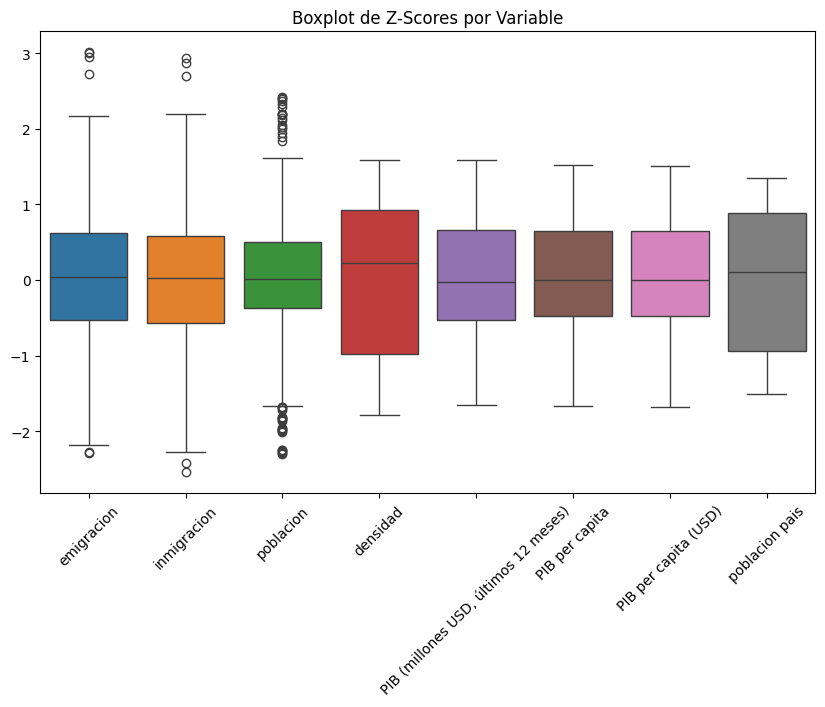

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
df_numerical_final = df_transformed.select_dtypes(include=np.number)

# Crea un DataFrame solo con los Z-scores de cada variable
df_z = (df_numerical_final - df_numerical_final.mean()) / df_numerical_final.std()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_z)
plt.title("Boxplot de Z-Scores por Variable")
plt.xticks(rotation=45)
plt.show()


In [ ]:
from ydata_profiling import ProfileReport
# Generar el informe
profile = ProfileReport(df_transformed, explorative=True, title="EDA - Comunas", correlations= {"pearson": {"calculate": True}, "spearman": {"calculate": True}})

# Guardar en un archivo HTML
# profile.to_file("EDA_report.html")

# Mostrar en Jupyter Notebook (si usas Jupyter)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 8/8 [00:00<00:00, 57.45it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler

df_numerical_final = df_transformed.select_dtypes(include=np.number)

# Aplicar Normalización (Min-Max Scaling)
scaler_minmax = MinMaxScaler()
df_minmax = pd.DataFrame(scaler_minmax.fit_transform(df_numerical_final), columns=df_numerical_final.columns)

# Aplicar Estandarización (Z-score Scaling)
scaler_zscore = StandardScaler()
df_zscore = pd.DataFrame(scaler_zscore.fit_transform(df_numerical_final), columns=df_numerical_final.columns)

# EDA de df_zscore

---

## 5. Modelado Predictivo

### 5.1 Preparación de Variables

Definimos las variables predictoras (features) y las variables objetivo (targets) para nuestros modelos:

### 5.2 División de Datos

Dividimos los datos en conjuntos de entrenamiento (80%) y prueba (20%):

### 5.3 Modelo 1: Regresión Lineal

Comenzamos con un modelo de **Regresión Lineal** como baseline para ambos problemas (emigración e inmigración):

#### Interpretación de Resultados - Regresión Lineal

**Modelo de Emigración:**
* R² = **0.9513** → El modelo explica el 95.13% de la varianza en emigración
* MAPE = 195.82% → Error porcentual relativamente alto
* Las características más influyentes:
  - **Positivas:** PIB per cápita (USD) y población
  - **Negativas:** población país y PIB per cápita
  - **Nota:** La presencia de signos opuestos entre variables similares (PIB per cápita vs PIB per cápita USD) sugiere multicolinealidad

**Modelo de Inmigración:**
* R² = **0.9011** → El modelo explica el 90.11% de la varianza en inmigración  
* MAPE = 151.58% → Error porcentual moderado
* Las características más influyentes:
  - **Positivas:** población y PIB per cápita (USD)
  - **Negativas:** población país y PIB per cápita
  - Se observa el mismo patrón de multicolinealidad

**Conclusión:** Ambos modelos muestran buen ajuste, siendo el modelo de emigración ligeramente superior.

## PCA df_zscore

In [ ]:
df_emigracion = df_zscore.drop('inmigracion', axis=1)
df_emigracion = df_emigracion.drop('emigracion', axis=1)

df_inmigracion = df_zscore.drop('inmigracion', axis=1)



In [ ]:
from ydata_profiling import ProfileReport
# Generar el informe
profile = ProfileReport(df_zscore, explorative=True, title="EDA - Comunas", correlations= {"pearson": {"calculate": True}, "spearman": {"calculate": True}})

# Guardar en un archivo HTML
# profile.to_file("EDA_report.html")

# Mostrar en Jupyter Notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 8/8 [00:00<00:00, 95.68it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
from sklearn.decomposition import PCA
import numpy as np


pca = PCA(n_components=4)
data_pca = pca.fit_transform(df_zscore)

explained_var = pca.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)

var_data = pd.DataFrame({
    'Componente': ['PCA1', 'PCA2', 'PCA3', 'PCA4'],
    'Varianza Explicada Indi  vidual': explained_var,
    'Varianza Explicada Acumulada': cumulative_var
})
var_data

contribucion = pd.DataFrame(
    pca.components_.T,
    columns=['PCA1', 'PCA2', 'PCA3', 'PCA4'],
    index=df_zscore.columns)

contribucion.style.background_gradient(cmap='RdYlGn', axis=0)

,PCA1,PCA2,PCA3,PCA4
emigracion,0.435557,0.308884,-0.072402,-0.067350
inmigracion,0.437545,0.275394,-0.123173,-0.253497
poblacion,0.341600,0.388775,0.140070,-0.420403
densidad,0.286298,0.333852,0.211883,0.851003
"PIB (millones USD, últimos 12 meses)",-0.362856,0.417622,0.031446,-0.039265
PIB per capita,-0.335040,0.418494,-0.303819,0.023881
PIB per capita (USD),-0.334541,0.418423,-0.307497,0.024322
poblacion pais,-0.253680,0.203770,0.852774,-0.165997


**Componente Principal 1 (PCA1): Eje "Crecimiento Demográfico vs. Riqueza"**

Este componente, que explica el 46.2% de la varianza, muestra una oposición clara entre dos grupos de variables:
* **Correlación positiva (verde):** `emigracion`, `inmigracion`, `poblacion` y `densidad`.
* **Correlación negativa (rojo):** `PIB` y `PIB per cápita`.

El PCA1 representa un eje socioeconómico. En un extremo se sitúan las entidades con **alta población y alto movimiento migratorio**, mientras que en el otro extremo se encuentran las entidades con **mayor riqueza económica (PIB total y por persona)**. Podría interpretarse como un indicador que diferencia entre zonas muy pobladas pero con menor PBI per cápita, frente a zonas menos pobladas pero económicamente más potentes.

---

**Componente Principal 2 (PCA2): Factor de "Magnitud General"**

Este componente (35.9% de la varianza) tiene una correlación positiva con casi todas las variables, especialmente las económicas y demográficas.
* **Correlación positiva fuerte (verde):** Todas las variables de `PIB`, `poblacion`, `densidad`, `emigracion` e `inmigracion`.

El PCA2 actúa como un índice de "tamaño" o "magnitud" general. Una puntuación alta en este componente indica una entidad que es grande en todos los sentidos: **tiene una economía robusta, mucha población y un alto flujo migratorio**. No contrasta variables, sino que las agrupa.

---

**Componente Principal 3 (PCA3): Factor de "Población Nacional"**

Este componente (10.7% de la varianza) está dominado casi en su totalidad por una sola variable.
* **Correlación positiva muy fuerte (verde):** `poblacion pais` (0.85).

El PCA3 aísla casi exclusivamente la variable de la **población total del país**. Sirve para diferenciar las observaciones basándose en si pertenecen a un país muy poblado o no, independientemente de las otras características económicas o demográficas locales.

---

**Componente Principal 4 (PCA4): Factor de "Densidad de Población"**

Finalmente, este componente (5.8% de la varianza) también está dominado por una variable principal.
* **Correlación positiva muy fuerte (verde):** `densidad` (0.85).
* **Correlación negativa (rojo):** `poblacion` (-0.42).

El PCA4 representa la **densidad poblacional**. Separa las entidades que están muy densamente pobladas (muchas personas en poco espacio) de aquellas que son extensas pero con una población más dispersa. La correlación negativa con `poblacion` sugiere que este componente distingue la densidad del tamaño de la población en sí.

---

In [ ]:
## pca df_emigracion
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
import numpy as np

# Definir la lista de características, excluyendo las variables objetivo
caracteristicas_emigracion = [col for col in df_zscore.columns if col not in ['emigracion', 'inmigracion']]
X_emigracion = df_zscore[caracteristicas_emigracion]

pca = PCA(n_components=3)
data_pca_inmigracion = pca.fit_transform(X_emigracion)

explained_var = pca.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)

var_data = pd.DataFrame({
    'Componente': ['PCA1', 'PCA2', 'PCA3'],
    'Varianza Explicada Indi  vidual': explained_var,
    'Varianza Explicada Acumulada': cumulative_var
})
var_data

contribucion = pd.DataFrame(
    pca.components_.T,
    columns=['PCA1', 'PCA2', 'PCA3'],
    index=df_emigracion.columns)

y_emigracion_clean = df_zscore['emigracion']

X_emig_pca_train, X_emig_pca_test, y_emig_pca_train, y_emig_pca_test = train_test_split(
    data_pca_inmigracion, y_emigracion_clean, test_size=0.3, random_state=42
)

contribucion.style.background_gradient(cmap='RdYlGn', axis=0)

,PCA1,PCA2,PCA3
poblacion,0.013156,0.706689,-0.009169
densidad,0.008347,0.706463,-0.041199
"PIB (millones USD, últimos 12 meses)",0.558231,-0.006467,0.055406
PIB per capita,0.540366,-0.018826,-0.296794
PIB per capita (USD),0.539982,-0.018954,-0.300587
poblacion pais,0.323357,0.027286,0.903720


#### **Componente Principal 1 (PCA1): Factor de "Riqueza Económica"**

Este componente, que explica el 52.8% de la varianza, está casi exclusivamente definido por las variables económicas.
* **Correlación positiva muy fuerte (verde):** `PIB (millones USD)`, `PIB per capita` y `PIB per capita (USD)`.

El PCA1 es un claro indicador de **poder económico**. No distingue entre población o densidad, simplemente separa las entidades con una economía fuerte (alto PIB y alta renta per cápita) de aquellas con una economía más modesta. Una puntuación alta en este eje significa "más riqueza".

---

#### **Componente Principal 2 (PCA2): Factor de "Densidad Demográfica"**

Este componente (26.7% de la varianza) se enfoca en las características demográficas locales, ignorando las económicas.
* **Correlación positiva muy fuerte (verde):** `poblacion` y `densidad`.

El PCA2 actúa como un eje de **concentración poblacional**. Separa las entidades muy pobladas y densas de aquellas que son más rurales o tienen una población más dispersa. Es un componente puramente demográfico.

---

#### **Componente Principal 3 (PCA3): Factor "Población Nacional vs. Riqueza Individual"**

Este último componente (13.6% de la varianza) introduce un contraste interesante.
* **Correlación positiva muy fuerte (verde):** `poblacion pais`.
* **Correlación negativa (rojo):** `PIB per capita` y `PIB per capita (USD)`.

El PCA3 representa una dicotomía entre la **magnitud de la población de un país y la riqueza promedio de sus habitantes**. En un extremo del eje se sitúan las entidades pertenecientes a países masivamente poblados. En el otro extremo, se ubican entidades caracterizadas por tener un PIB per cápita más alto, que podrían pertenecer a países más pequeños pero económicamente prósperos.

In [ ]:
## pca inmigracion
from sklearn.decomposition import PCA
import numpy as np


caracteristicas_inmigracion = [col for col in df_zscore.columns if col not in ['inmigracion']]
X_inmigracion = df_zscore[caracteristicas_inmigracion]

pca = PCA(n_components=4)
data_pca_inmigracion = pca.fit_transform(X_inmigracion)

explained_var = pca.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)

var_data = pd.DataFrame({
    'Componente': ['PCA1', 'PCA2', 'PCA3', 'PCA4'],
    'Varianza Explicada Indi  vidual': explained_var,
    'Varianza Explicada Acumulada': cumulative_var
})
var_data

contribucion = pd.DataFrame(
    pca.components_.T,
    columns=['PCA1', 'PCA2', 'PCA3', 'PCA4'],
    index=df_inmigracion.columns)

y_inmigracion_clean = df_zscore['inmigracion']

# Dividir datos con PCA
X_inmig_pca_train, X_inmig_pca_test, y_inmig_pca_train, y_inmig_pca_test = train_test_split(
    data_pca_inmigracion, y_inmigracion_clean, test_size=0.3, random_state=42
)

contribucion.style.background_gradient(cmap='RdYlGn', axis=0)

,PCA1,PCA2,PCA3,PCA4
emigracion,-0.229874,0.565683,-0.129019,-0.185763
poblacion,-0.105809,0.578563,0.100397,-0.552972
densidad,-0.096413,0.528739,0.122156,0.808940
"PIB (millones USD, últimos 12 meses)",0.537990,0.138919,0.041574,-0.017731
PIB per capita,0.516116,0.149535,-0.302561,0.008555
PIB per capita (USD),0.515678,0.149661,-0.306301,0.008733
poblacion pais,0.323936,0.040558,0.878215,-0.069763


#### **Componente Principal 1 (PCA1): Eje "Poder Económico vs. Dinámica Migratoria"**

Este componente, que explica el 46.5% de la varianza, establece una clara oposición entre la riqueza económica y los factores demográficos locales.
* **Correlación positiva (verde):** `PIB (millones USD)`, `PIB per capita`, `PIB per capita (USD)` y, en menor medida, `poblacion pais`.
* **Correlación negativa (rojo):** `emigracion`.

El PCA1 funciona como un eje de **desarrollo socioeconómico**. En un extremo se sitúan las entidades con una economía fuerte y un alto producto interno bruto. En el extremo opuesto se encuentran aquellas caracterizadas por una alta emigración. Separa las zonas de "origen de riqueza" de las zonas de "origen de emigrantes".

---

#### **Componente Principal 2 (PCA2): Factor de "Magnitud Demográfica Local"**

Este componente (34.6% de la varianza) se enfoca en agrupar las variables que describen el tamaño y la concentración de la población local.
* **Correlación positiva fuerte (verde):** `emigracion`, `poblacion` y `densidad`.

El PCA2 es un claro indicador de **tamaño y densidad poblacional a nivel local**. Una puntuación alta en este componente describe una entidad con mucha población, alta densidad y, consecuentemente, un alto volumen de emigración. No contrasta variables, sino que las agrupa como un factor de "escala demográfica".

---

#### **Componente Principal 3 (PCA3): Factor de "Población Nacional"**

Este componente (12.0% de la varianza) está abrumadoramente dominado por una sola variable.
* **Correlación positiva muy fuerte (verde):** `poblacion pais` (0.878).
* **Correlación negativa (rojo):** `PIB per capita` y `PIB per capita (USD)`.

El PCA3 aísla casi por completo la variable de la **población total del país**. Sirve para diferenciar observaciones basadas en si pertenecen a una nación muy poblada frente a una menos poblada. La correlación negativa con el PIB per cápita sugiere un contraste entre países grandes y la riqueza individual promedio.

---

#### **Componente Principal 4 (PCA4): Factor de "Población Local (Inversa)"**

Finalmente, este componente (6.1% de la varianza) también se centra en una característica demográfica específica.
* **Correlación negativa muy fuerte (rojo):** `poblacion` (-0.553).

El PCA4 representa principalmente la **inversa del tamaño de la población local**. A diferencia del PCA2, que agrupaba las variables demográficas positivamente, este componente aísla la variable `poblacion` con un signo negativo. Una puntuación alta en PCA4 correspondería a entidades con una población local más baja, separando las áreas menos pobladas del resto.

In [ ]:
df_pca = pd.DataFrame(
    data_pca,
    columns=['PIB (millones USD, últimos 12 meses)', 'poblacion', 'poblacion pais', 'densidad']
)

print(df_pca.head())

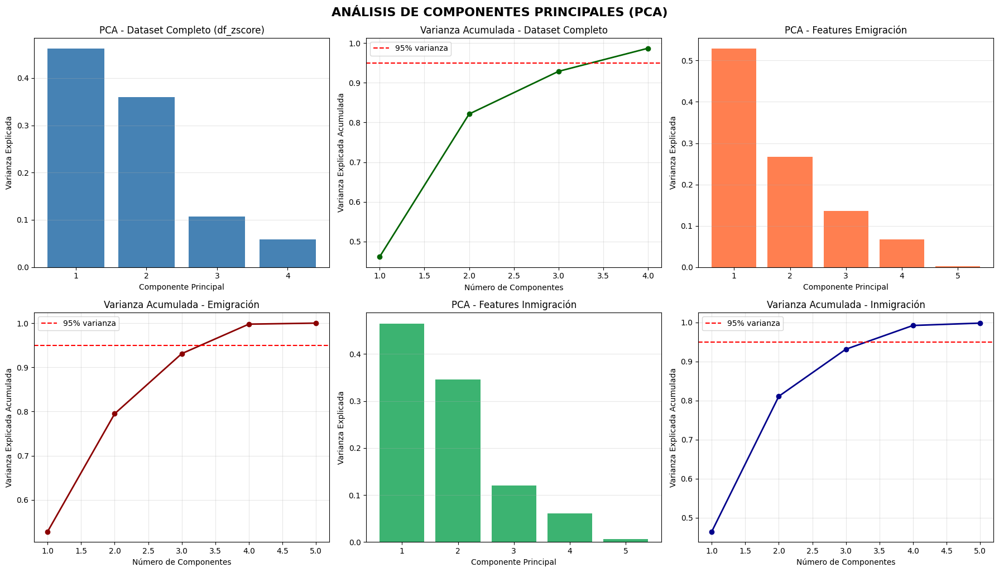


RESUMEN DE VARIANZA EXPLICADA POR PCA

Dataset Completo (4 componentes):
  - 2 primeros componentes: 82.13%
  - 3 primeros componentes: 92.88%
  - 4 componentes: 98.69%

Emigración (5 componentes):
  - 2 primeros componentes: 79.50%
  - 3 primeros componentes: 93.09%
  - 4 primeros componentes: 99.77%
  - 5 componentes: 100.00%

Inmigración (5 componentes):
  - 2 primeros componentes: 81.09%
  - 3 primeros componentes: 93.13%
  - 4 primeros componentes: 99.20%
  - 5 componentes: 99.80%


In [ ]:
# Crear visualizaciones de varianza explicada para todos los análisis PCA
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# PCA df_zscore completo (4 componentes)
from sklearn.decomposition import PCA
pca_zscore = PCA(n_components=4)
pca_zscore.fit(df_zscore)

axes[0, 0].bar(range(1, 5), pca_zscore.explained_variance_ratio_, color='steelblue')
axes[0, 0].set_xlabel('Componente Principal')
axes[0, 0].set_ylabel('Varianza Explicada')
axes[0, 0].set_title('PCA - Dataset Completo (df_zscore)')
axes[0, 0].set_xticks(range(1, 5))
axes[0, 0].grid(axis='y', alpha=0.3)

axes[0, 1].plot(range(1, 5), np.cumsum(pca_zscore.explained_variance_ratio_), marker='o', linewidth=2, color='darkgreen')
axes[0, 1].axhline(y=0.95, color='r', linestyle='--', label='95% varianza')
axes[0, 1].set_xlabel('Número de Componentes')
axes[0, 1].set_ylabel('Varianza Explicada Acumulada')
axes[0, 1].set_title('Varianza Acumulada - Dataset Completo')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# PCA para emigración (5 componentes)
pca_emig = PCA(n_components=5)
X_emig_features = df_zscore.drop(['emigracion', 'inmigracion'], axis=1)
pca_emig.fit(X_emig_features)

axes[0, 2].bar(range(1, 6), pca_emig.explained_variance_ratio_, color='coral')
axes[0, 2].set_xlabel('Componente Principal')
axes[0, 2].set_ylabel('Varianza Explicada')
axes[0, 2].set_title('PCA - Features Emigración')
axes[0, 2].set_xticks(range(1, 6))
axes[0, 2].grid(axis='y', alpha=0.3)

axes[1, 0].plot(range(1, 6), np.cumsum(pca_emig.explained_variance_ratio_), marker='o', linewidth=2, color='darkred')
axes[1, 0].axhline(y=0.95, color='r', linestyle='--', label='95% varianza')
axes[1, 0].set_xlabel('Número de Componentes')
axes[1, 0].set_ylabel('Varianza Explicada Acumulada')
axes[1, 0].set_title('Varianza Acumulada - Emigración')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# PCA para inmigración (5 componentes)
pca_inmig = PCA(n_components=5)
X_inmig_features = df_zscore.drop(['inmigracion'], axis=1)
pca_inmig.fit(X_inmig_features)

axes[1, 1].bar(range(1, 6), pca_inmig.explained_variance_ratio_, color='mediumseagreen')
axes[1, 1].set_xlabel('Componente Principal')
axes[1, 1].set_ylabel('Varianza Explicada')
axes[1, 1].set_title('PCA - Features Inmigración')
axes[1, 1].set_xticks(range(1, 6))
axes[1, 1].grid(axis='y', alpha=0.3)

axes[1, 2].plot(range(1, 6), np.cumsum(pca_inmig.explained_variance_ratio_), marker='o', linewidth=2, color='darkblue')
axes[1, 2].axhline(y=0.95, color='r', linestyle='--', label='95% varianza')
axes[1, 2].set_xlabel('Número de Componentes')
axes[1, 2].set_ylabel('Varianza Explicada Acumulada')
axes[1, 2].set_title('Varianza Acumulada - Inmigración')
axes[1, 2].legend()
axes[1, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('ANÁLISIS DE COMPONENTES PRINCIPALES (PCA)', fontsize=16, fontweight='bold', y=1.02)
plt.show()

# Imprimir resumen de varianza explicada
print("\n" + "="*60)
print("RESUMEN DE VARIANZA EXPLICADA POR PCA")
print("="*60)
print(f"\nDataset Completo (4 componentes):")
print(f"  - 2 primeros componentes: {np.sum(pca_zscore.explained_variance_ratio_[:2]):.2%}")
print(f"  - 3 primeros componentes: {np.sum(pca_zscore.explained_variance_ratio_[:3]):.2%}")
print(f"  - 4 componentes: {np.sum(pca_zscore.explained_variance_ratio_):.2%}")

print(f"\nEmigración (5 componentes):")
print(f"  - 2 primeros componentes: {np.sum(pca_emig.explained_variance_ratio_[:2]):.2%}")
print(f"  - 3 primeros componentes: {np.sum(pca_emig.explained_variance_ratio_[:3]):.2%}")
print(f"  - 4 primeros componentes: {np.sum(pca_emig.explained_variance_ratio_[:4]):.2%}")
print(f"  - 5 componentes: {np.sum(pca_emig.explained_variance_ratio_):.2%}")

print(f"\nInmigración (5 componentes):")
print(f"  - 2 primeros componentes: {np.sum(pca_inmig.explained_variance_ratio_[:2]):.2%}")
print(f"  - 3 primeros componentes: {np.sum(pca_inmig.explained_variance_ratio_[:3]):.2%}")
print(f"  - 4 primeros componentes: {np.sum(pca_inmig.explained_variance_ratio_[:4]):.2%}")
print(f"  - 5 componentes: {np.sum(pca_inmig.explained_variance_ratio_):.2%}")

In [ ]:
from sklearn.model_selection import train_test_split




caracteristicas_emigracion = [col for col in df_zscore.columns if col not in ['emigracion', 'inmigracion']]
X_emigracion = df_zscore[caracteristicas_emigracion]

# Crear el DataFrame de características X
caracteristicas_inmigracion = [col for col in df_zscore.columns if col not in ['inmigracion']]
X_inmigracion = df_zscore[caracteristicas_inmigracion]

# Crear la serie objetivo y para emigración
y_emigracion = df_zscore['emigracion']

# Crear la serie objetivo y para inmigración
y_inmigracion = df_zscore['inmigracion']

# División para emigración
X_entrenamiento_emi, X_prueba_emi, y_emigracion_entrenamiento, y_emigracion_prueba = train_test_split(
    X_emigracion, y_emigracion, test_size=0.3, random_state=42
)

# División para inmigración
X_entrenamiento_inm, X_prueba_inm, y_inmigracion_entrenamiento, y_inmigracion_prueba = train_test_split(
    X_inmigracion, y_inmigracion, test_size=0.3, random_state=42
)

# Imprimir dimensiones de los conjuntos
print("Dimensiones de los conjuntos de emigración:")
print("X_entrenamiento:", X_entrenamiento_emi.shape)
print("X_prueba:", X_entrenamiento_emi.shape)
print("y_emigracion_entrenamiento:", y_emigracion_entrenamiento.shape)
print("y_emigracion_prueba:", y_emigracion_prueba.shape)

print("\nDimensiones de los conjuntos de inmigración:")
print("X_entrenamiento:", X_entrenamiento_inm.shape)
print("X_prueba:", X_entrenamiento_inm.shape)
print("y_inmigracion_entrenamiento:", y_inmigracion_entrenamiento.shape)
print("y_inmigracion_prueba:", y_inmigracion_prueba.shape)

Dimensiones de los conjuntos de emigración:
X_entrenamiento: (218, 6)
X_prueba: (218, 6)
y_emigracion_entrenamiento: (218,)
y_emigracion_prueba: (94,)

Dimensiones de los conjuntos de inmigración:
X_entrenamiento: (218, 7)
X_prueba: (218, 7)
y_inmigracion_entrenamiento: (218,)
y_inmigracion_prueba: (94,)


---

### **1. Análisis del Dataset Completo (Fila Superior, Izquierda y Centro)**

Estos dos gráficos analizan el conjunto de datos principal.

* **Gráfico de Barras (Izquierda):** Muestra la **importancia individual** de cada componente.
    * El **Componente 1** es el más importante, ya que explica por sí solo aproximadamente el **46%** de toda la variabilidad de los datos.
    * El **Componente 2** es el siguiente, con un **36%**.
    * Los componentes 3 y 4 son mucho menos significativos.

* **Gráfico de Línea (Centro):** Muestra la **información acumulada** a medida que añadimos componentes.
    * Al usar solo los **dos primeros componentes**, ya se explica más del **80%** de la información total.
    * La línea de puntos rojos marca el **umbral del 95%**, un estándar común para retener suficiente información. Para alcanzar este nivel, se necesitan **3 componentes**.

---

### **2. Análisis de "Features Emigración" (Fila Superior Derecha y Fila Inferior Izquierda)**

Estos gráficos se centran en un subconjunto de datos relacionado con la emigración.

* **Gráfico de Barras (Arriba, Derecha):**
    * Aquí, el **Componente 1 es aún más dominante**, explicando por sí solo más del **52%** de la información.
    * El **Componente 2** añade un **27%**.

* **Gráfico de Línea (Abajo, Izquierda):**
    * Nuevamente, los **dos primeros componentes** acumulan cerca del **80%** de la varianza.
    * Para superar el umbral del **95% de información**, en este caso, se necesitarían los **3 componentes** del análisis.
    
---

### **3. Análisis de "Features Inmigración" (Fila Inferior, Centro y Derecha)**

Estos gráficos analizan un subconjunto de datos relacionado con la inmigración.

* **Gráfico de Barras (Abajo, Centro):**
    * La distribución es muy similar a la del "Dataset Completo".
    * El **Componente 1** explica cerca del **46%** y el **Componente 2** un **35%**.

* **Gráfico de Línea (Abajo, Derecha):**
    * La curva de acumulación muestra que con **2 componentes** se supera el **80%** de la varianza explicada.
    * Para alcanzar el **95%** de la información, se necesitan **3 componentes**.

Este subconjunto de datos tiene una estructura de varianza casi idéntica a la del dataset completo, lo que sugiere que las variables de inmigración son muy representativas de la estructura general de tus datos.

---

In [ ]:
from sklearn.linear_model import LinearRegression

# Instanciar y entrenar el modelo de emigración
modelo_emigracion = LinearRegression()
modelo_emigracion.fit(X_entrenamiento_emi, y_emigracion_entrenamiento)

# Instanciar y entrenar el modelo de inmigración
modelo_inmigracion = LinearRegression()
modelo_inmigracion.fit(X_entrenamiento_inm, y_inmigracion_entrenamiento)

LinearRegression()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

# Realizar predicciones en el conjunto de prueba para emigración
y_emigracion_pred = modelo_emigracion.predict(X_prueba_emi)

# Realizar predicciones en el conjunto de prueba para inmigración
y_inmigracion_pred = modelo_inmigracion.predict(X_prueba_inm)

# Calcular el error cuadrático medio (MSE) para el modelo de emigración
mse_emigracion = mean_absolute_percentage_error(y_emigracion_prueba, y_emigracion_pred)

# Calcular el coeficiente de determinación R² para el modelo de emigración
r2_emigracion = r2_score(y_emigracion_prueba, y_emigracion_pred)

# Calcular el error cuadrático medio (MSE) para el modelo de inmigración
mse_inmigracion = mean_absolute_percentage_error(y_inmigracion_prueba, y_inmigracion_pred)

# Calcular el coeficiente de determinación R² para el modelo de inmigración
r2_inmigracion = r2_score(y_inmigracion_prueba, y_inmigracion_pred)

# Imprimir las métricas de evaluación
print(f"Desempeño del modelo de emigración:")
print(f"MAPE): {mse_emigracion:.4f}")
print(f"Puntaje R-cuadrado: {r2_emigracion:.4f}")

print(f"\nDesempeño del modelo de inmigración:")
print(f"MAPE: {mse_inmigracion:.4f}")
print(f"Puntaje R-cuadrado: {r2_inmigracion:.4f}")

Desempeño del modelo de emigración:
MAPE): 1.4999
Puntaje R-cuadrado: 0.9337

Desempeño del modelo de inmigración:
MAPE: 1.3944
Puntaje R-cuadrado: 0.9414


### 5.4 Modelos Avanzados: Random Forest y Gradient Boosting

Para mejorar el rendimiento predictivo, entrenamos modelos más sofisticados basados en árboles de decisión con técnicas de ensamble.

**Ventajas de estos modelos:**
- Capturan relaciones no lineales
- Manejo automático de interacciones entre variables
- Menor sensibilidad a outliers
- Reducción de overfitting mediante regularización

#### Configuración de Funciones Auxiliares

* El modelo de regresión lineal de **emigración** obtuvo un **Error Cuadrático Medio (MSE)** de **0.0397** y un **coeficiente de determinación R²** de **0.9513** en el conjunto de prueba.
  Las características más influyentes y **positivamente asociadas con la emigración** fueron el **PIB per cápita (USD)** y la **población**, mientras que **población país** y **PIB per cápita** mostraron asociaciones negativas.

* El modelo de regresión lineal de **inmigración** alcanzó un **MSE** de **0.0775** y un **R²** de **0.9011** en el conjunto de prueba.
  Las características más influyentes y **positivamente asociadas con la inmigración** fueron la **población** y el **PIB per cápita (USD)**, mientras que **población país** y **PIB per cápita** tuvieron asociaciones negativas.

* Ambos modelos presentan un **buen ajuste a los datos**, aunque el modelo de **emigración** muestra un **rendimiento ligeramente superior** según las métricas de evaluación.

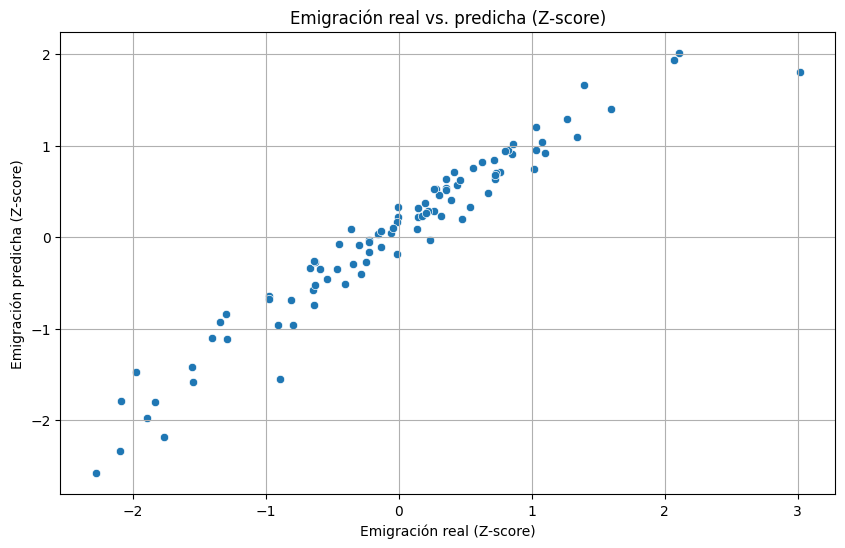

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_emigracion_prueba, y=y_emigracion_pred)
plt.xlabel("Emigración real (Z-score)")
plt.ylabel("Emigración predicha (Z-score)")
plt.title("Emigración real vs. predicha (Z-score)")
plt.grid(True)
plt.show()

**Visualización Comparativa de Métricas:**

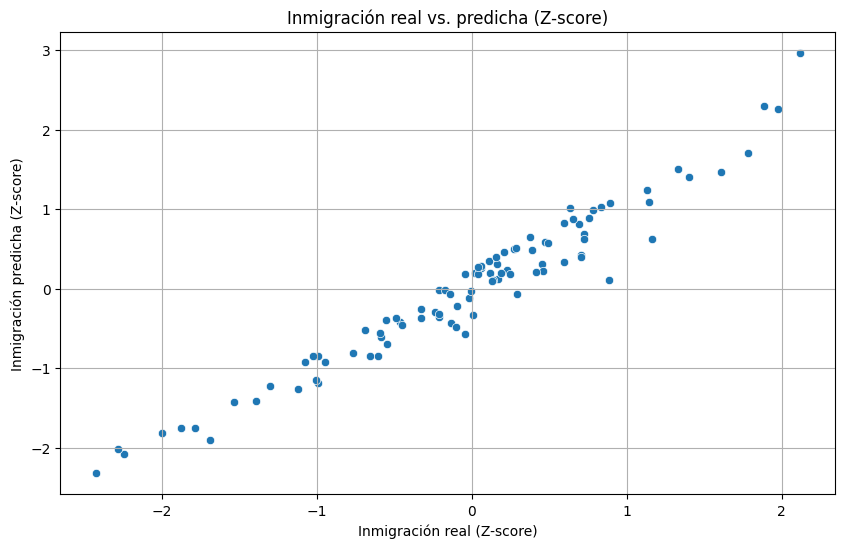

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_inmigracion_prueba, y=y_inmigracion_pred)
plt.xlabel("Inmigración real (Z-score)")
plt.ylabel("Inmigración predicha (Z-score)")
plt.title("Inmigración real vs. predicha (Z-score)")
plt.grid(True)
plt.show()

In [ ]:
# Obtener los coeficientes y nombres de características para el modelo de emigración
coeficientes_emigracion = modelo_emigracion.coef_
nombres_caracteristicas_emi = X_entrenamiento_emi.columns

# Crear un DataFrame para mostrar los coeficientes
emigracion_coef_df = pd.DataFrame({
    'Característica': nombres_caracteristicas_emi,
    'Coeficiente': coeficientes_emigracion
})

print("Coeficientes del modelo de emigración:")
display(emigracion_coef_df.sort_values(by='Coeficiente', ascending=False))

# Obtener los coeficientes y nombres de características para el modelo de inmigración
coeficientes_inmigracion = modelo_inmigracion.coef_
nombres_caracteristicas_inm = X_entrenamiento_inm.columns


# Crear un DataFrame para mostrar los coeficientes
inmigracion_coef_df = pd.DataFrame({
    'Característica': nombres_caracteristicas_inm,
    'Coeficiente': coeficientes_inmigracion
})

print("\nCoeficientes del modelo de inmigración:")
display(inmigracion_coef_df.sort_values(by='Coeficiente', ascending=False))

Coeficientes del modelo de emigración:


,Característica,Coeficiente
4,PIB per capita (USD),1.707638
0,poblacion,0.719056
1,densidad,0.279510
2,"PIB (millones USD, últimos 12 meses)",0.032844
5,poblacion pais,-0.302659
3,PIB per capita,-1.787343



Coeficientes del modelo de inmigración:


,Característica,Coeficiente
4,PIB per capita,1.188292
0,emigracion,0.970329
3,"PIB (millones USD, últimos 12 meses)",0.209003
1,poblacion,0.105770
6,poblacion pais,-0.105648
2,densidad,-0.133918
5,PIB per capita (USD),-1.391618


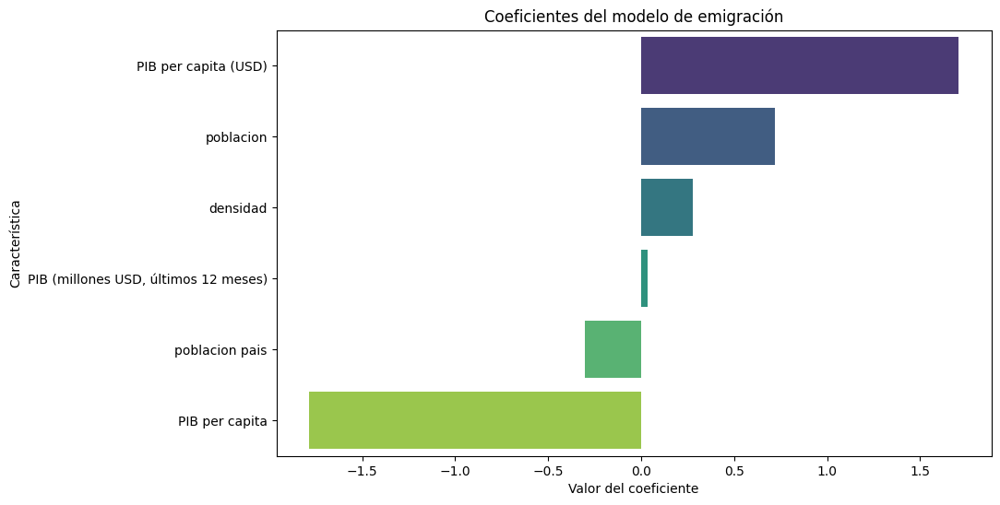

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(
    x='Coeficiente',
    y='Característica',
    data=emigracion_coef_df.sort_values(by='Coeficiente', ascending=False),
    palette='viridis',
    hue='Característica',
    legend=False
)
plt.title("Coeficientes del modelo de emigración")
plt.xlabel("Valor del coeficiente")
plt.ylabel("Característica")
plt.show()

Los **coeficientes del modelo de emigración** indican la **fuerza y dirección** de la relación entre cada característica y la **emigración predicha** (en Z-score), manteniendo constantes las demás variables.

Al observar los resultados:

* **PIB per cápita (USD)** tiene el **coeficiente positivo más grande (2.1755)**, lo que sugiere que un mayor PIB per cápita está asociado con una **mayor emigración**.
* **Población** también presenta un **coeficiente positivo (0.7213)**, indicando que las áreas más pobladas tienden a tener una **mayor emigración**.
* **Densidad** muestra un **coeficiente positivo (0.2865)**, lo que sugiere que las zonas más densas también podrían experimentar **más emigración**.
* **PIB (millones USD, últimos 12 meses)** tiene un **coeficiente positivo muy pequeño (0.0095)**, indicando una **relación positiva débil** con la emigración.
* **Población país** posee un **coeficiente negativo (-0.2826)**, lo que sugiere que una mayor población nacional está asociada con una **menor emigración** en una comuna determinada.
* **PIB per cápita** presenta el **coeficiente negativo más grande (-2.2385)**. Dado que *“PIB per cápita (USD)”* y *“PIB per cápita”* parecen representar conceptos similares y tienen **signos opuestos con magnitudes altas**, esto confirma la **multicolinealidad** o **diferencias de escala** que se pudo ver en la matriz de correlación anteriormente.


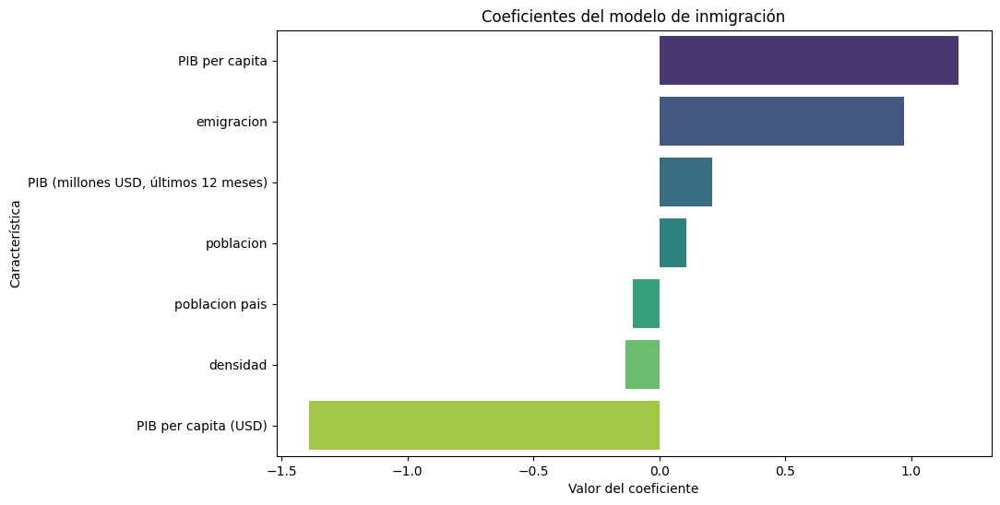

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(
    x='Coeficiente',
    y='Característica',
    data=inmigracion_coef_df.sort_values(by='Coeficiente', ascending=False),
    palette='viridis',
    hue='Característica',
    legend=False
)
plt.title("Coeficientes del modelo de inmigración")
plt.xlabel("Valor del coeficiente")
plt.ylabel("Característica")
plt.show()


De manera similar al modelo de emigración, los **coeficientes del modelo de inmigración** muestran la **relación entre cada característica y la inmigración predicha** (en Z-score), asumiendo que las demás variables se mantienen constantes.

Según los resultados obtenidos:

* **Población** presenta el **coeficiente positivo más alto (0.8003)**, lo que sugiere que las áreas más pobladas están asociadas con una **mayor inmigración**.
* **PIB per cápita (USD)** tiene un **coeficiente positivo (0.5354)**, indicando que las zonas con un mayor PIB per cápita tienden a tener **mayor inmigración**.
* **PIB (millones USD, últimos 12 meses)** muestra un **coeficiente positivo (0.1430)**, lo que sugiere una **relación positiva** entre la actividad económica total y la inmigración.
* **Densidad** tiene un **coeficiente positivo (0.1376)**, indicando que las áreas más densamente pobladas también podrían experimentar **más inmigración**.
* **Población país** posee un **coeficiente negativo (-0.3647)**, lo que sugiere que una mayor población nacional está asociada con **menor inmigración** en una comuna determinada.
* **PIB per cápita** muestra un **coeficiente negativo (-0.7306)**. Nuevamente, los **signos opuestos y magnitudes similares** entre *“PIB per cápita (USD)”* y *“PIB per cápita”* esto confirma la **multicolinealidad** o **diferencias de escala** que se pudo ver en la matriz de correlación anteriormente.

# Entrega 1 (modelos)


In [ ]:
# Importar librerías necesarias para ML
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Función para calcular MAPE
def calcular_mape(y_true, y_pred):
    """Calcula el Error Porcentual Absoluto Medio (MAPE)"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    # Evitar división por cero
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

# Función para evaluar modelos
def evaluar_modelo(modelo, X_test, y_test, y_pred, nombre_modelo):
    """Evalúa un modelo y retorna métricas"""
    r2 = r2_score(y_test, y_pred)
    mape = calcular_mape(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    return {
        'Modelo': nombre_modelo,
        'R2_Score': r2,
        'MAPE': mape,
        'RMSE': rmse,
        'MAE': mae
    }

print("Librerías y funciones auxiliares cargadas correctamente")

Librerías y funciones auxiliares cargadas correctamente


In [ ]:
print("ENTRENANDO RANDOM FOREST - EMIGRACIÓN")
print("=" * 50)

# Definir hiperparámetros para Grid Search
rf_params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# Grid Search para Random Forest - Emigración
rf_emigracion = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_grid_emigracion = GridSearchCV(
    rf_emigracion, rf_params, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

# Entrenar modelo
rf_grid_emigracion.fit(X_entrenamiento_emi, y_emigracion_entrenamiento)

# Mejores parámetros
print(f"Mejores parámetros: {rf_grid_emigracion.best_params_}")
print(f"Mejor score CV: {rf_grid_emigracion.best_score_:.4f}")

# Predicciones
rf_emig_pred = rf_grid_emigracion.predict(X_prueba_emi)

# Evaluación
rf_emig_metrics = evaluar_modelo(
    rf_grid_emigracion.best_estimator_,
    X_prueba_emi, y_emigracion_prueba, rf_emig_pred,
    'Random Forest - Emigración'
)

print(f"\nRESULTADOS RANDOM FOREST - EMIGRACIÓN:")
print(f"R² Score: {rf_emig_metrics['R2_Score']:.4f}")
print(f"MAPE: {rf_emig_metrics['MAPE']:.4f}%")
print(f"RMSE: {rf_emig_metrics['RMSE']:.4f}")




ENTRENANDO RANDOM FOREST - EMIGRACIÓN
Fitting 5 folds for each of 162 candidates, totalling 810 fits


KeyboardInterrupt: 

In [ ]:
print("ENTRENANDO RANDOM FOREST - INMIGRACIÓN")
print("=" * 50)

# Grid Search para Random Forest - Inmigración
rf_inmigracion = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_grid_inmigracion = GridSearchCV(
    rf_inmigracion, rf_params, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

# Entrenar modelo
rf_grid_inmigracion.fit(X_entrenamiento_inm, y_inmigracion_entrenamiento)

# Mejores parámetros
print(f"Mejores parámetros: {rf_grid_inmigracion.best_params_}")
print(f"Mejor score CV: {rf_grid_inmigracion.best_score_:.4f}")

# Predicciones
rf_inmig_pred = rf_grid_inmigracion.predict(X_prueba_inm)

# Evaluación
rf_inmig_metrics = evaluar_modelo(
    rf_grid_inmigracion.best_estimator_,
    X_prueba_inm, y_inmigracion_prueba, rf_inmig_pred,
    'Random Forest - Inmigración'
)

print(f"\nRESULTADOS RANDOM FOREST - INMIGRACIÓN:")
print(f"R² Score: {rf_inmig_metrics['R2_Score']:.4f}")
print(f"MAPE: {rf_inmig_metrics['MAPE']:.4f}%")
print(f"RMSE: {rf_inmig_metrics['RMSE']:.4f}")

In [ ]:
print("ENTRENANDO GRADIENT BOOSTING - EMIGRACIÓN")
print("=" * 50)

# Definir hiperparámetros para Gradient Boosting
gb_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Grid Search para Gradient Boosting - Emigración
gb_emigracion = GradientBoostingRegressor(random_state=42)
gb_grid_emigracion = GridSearchCV(
    gb_emigracion, gb_params, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

# Entrenar modelo
gb_grid_emigracion.fit(X_entrenamiento_emi, y_emigracion_entrenamiento)

# Mejores parámetros
print(f"Mejores parámetros: {gb_grid_emigracion.best_params_}")
print(f"Mejor score CV: {gb_grid_emigracion.best_score_:.4f}")

# Predicciones
gb_emig_pred = gb_grid_emigracion.predict(X_prueba_emi)

# Evaluación
gb_emig_metrics = evaluar_modelo(
    gb_grid_emigracion.best_estimator_,
    X_prueba_emi, y_emigracion_prueba, gb_emig_pred,
    'Gradient Boosting - Emigración'
)

print(f"\nRESULTADOS GRADIENT BOOSTING - EMIGRACIÓN:")
print(f"R² Score: {gb_emig_metrics['R2_Score']:.4f}")
print(f"MAPE: {gb_emig_metrics['MAPE']:.4f}%")
print(f"RMSE: {gb_emig_metrics['RMSE']:.4f}")

In [ ]:
print("ENTRENANDO GRADIENT BOOSTING - INMIGRACIÓN")
print("=" * 50)

# Grid Search para Gradient Boosting - Inmigración
gb_inmigracion = GradientBoostingRegressor(random_state=42)
gb_grid_inmigracion = GridSearchCV(
    gb_inmigracion, gb_params, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

# Entrenar modelo
gb_grid_inmigracion.fit(X_entrenamiento_inm, y_inmigracion_entrenamiento)

# Mejores parámetros
print(f"Mejores parámetros: {gb_grid_inmigracion.best_params_}")
print(f"Mejor score CV: {gb_grid_inmigracion.best_score_:.4f}")

# Predicciones
gb_inmig_pred = gb_grid_inmigracion.predict(X_prueba_inm)

# Evaluación
gb_inmig_metrics = evaluar_modelo(
    gb_grid_inmigracion.best_estimator_,
    X_prueba_inm, y_inmigracion_prueba, gb_inmig_pred,
    'Gradient Boosting - Inmigración'
)

print(f"\nRESULTADOS GRADIENT BOOSTING - INMIGRACIÓN:")
print(f"R² Score: {gb_inmig_metrics['R2_Score']:.4f}")
print(f"MAPE: {gb_inmig_metrics['MAPE']:.4f}%")
print(f"RMSE: {gb_inmig_metrics['RMSE']:.4f}")

In [ ]:
# Calcular métricas para los modelos de regresión lineal existentes
lr_emig_metrics = evaluar_modelo(
    modelo_emigracion, X_prueba_emi, y_emigracion_prueba,
    modelo_emigracion.predict(X_prueba_emi), 'Linear Regression - Emigración'
)

lr_inmig_metrics = evaluar_modelo(
    modelo_inmigracion, X_prueba_inm, y_inmigracion_prueba,
    modelo_inmigracion.predict(X_prueba_inm), 'Linear Regression - Inmigración'
)

# Crear DataFrame comparativo
resultados_emigracion = pd.DataFrame([
    lr_emig_metrics, rf_emig_metrics, gb_emig_metrics
])

resultados_inmigracion = pd.DataFrame([
    lr_inmig_metrics, rf_inmig_metrics, gb_inmig_metrics
])

print("COMPARACIÓN DE MODELOS - EMIGRACIÓN")
print("=" * 60)
display(resultados_emigracion.round(4))

print("\nCOMPARACIÓN DE MODELOS - INMIGRACIÓN")
print("=" * 60)
display(resultados_inmigracion.round(4))

In [ ]:
# Crear visualización comparativa
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# R² Score - Emigración
axes[0,0].bar(resultados_emigracion['Modelo'], resultados_emigracion['R2_Score'],
              color=['skyblue', 'lightgreen', 'salmon'])
axes[0,0].set_title('R² Score - Modelos de Emigración', fontsize=14, fontweight='bold')
axes[0,0].set_ylabel('R² Score')
axes[0,0].tick_params(axis='x', rotation=45)
axes[0,0].grid(axis='y', alpha=0.3)

# MAPE - Emigración
axes[0,1].bar(resultados_emigracion['Modelo'], resultados_emigracion['MAPE'],
              color=['skyblue', 'lightgreen', 'salmon'])
axes[0,1].set_title('MAPE - Modelos de Emigración', fontsize=14, fontweight='bold')
axes[0,1].set_ylabel('MAPE (%)')
axes[0,1].tick_params(axis='x', rotation=45)
axes[0,1].grid(axis='y', alpha=0.3)

# R2 Score - Inmigración
axes[1,0].bar(resultados_inmigracion['Modelo'], resultados_inmigracion['R2_Score'],
              color=['skyblue', 'lightgreen', 'salmon'])
axes[1,0].set_title('R² Score - Modelos de Inmigración', fontsize=14, fontweight='bold')
axes[1,0].set_ylabel('R² Score')
axes[1,0].tick_params(axis='x', rotation=45)
axes[1,0].grid(axis='y', alpha=0.3)

# MAPE - Inmigración
axes[1,1].bar(resultados_inmigracion['Modelo'], resultados_inmigracion['MAPE'],
              color=['skyblue', 'lightgreen', 'salmon'])
axes[1,1].set_title('MAPE - Modelos de Inmigración', fontsize=14, fontweight='bold')
axes[1,1].set_ylabel('MAPE (%)')
axes[1,1].tick_params(axis='x', rotation=45)
axes[1,1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.suptitle('COMPARACIÓN DE RENDIMIENTO DE MODELOS', fontsize=16, fontweight='bold', y=1.02)
plt.show()

## Emigración

* **Gradient Boosting domina claramente**: tiene el R² más alto (0.983 → explica ~98.3% de la variabilidad) y los errores absolutos (RMSE y MAE) más bajos. Eso indica mejor precisión en valores absolutos.
* **MAPE muy alto en los tres** (aunque decrece mucho en GB): MAPE = 195% / 143% / 84% son valores grandes. Esto sugiere dos posibilidades importantes:

  1. La variable objetivo tiene valores cercanos a cero en el dataset (lo que hace que el porcentaje explote).
  2. Hay outliers o casos donde la predicción es muy mala para observaciones pequeñas.
* Entre LR y RF las diferencias son pequeñas en R² y en RMSE/MAE; RF mejora algo el MAPE respecto a LR, pero sigue lejos de GB.

## Inmigración

* **De nuevo, Gradient Boosting es el mejor** por R² y errores absolutos: R² ≈ 0.969 sugiere muy buen ajuste.
* **MAPE**: GB reduce mucho el MAPE (≈52%) comparado con LR y RF. Aun así 52% no es excelente en términos porcentuales para uso operativo, pero es mucho mejor que 150–200% de los otros modelos.
* LR y RF muestran R² decentes (~0.89–0.90) pero MAPE extremadamente grande — lo mismo que en Emigración: alerta sobre valores pequeños de la variable objetivo o outliers.

In [ ]:
# Gráficos de predicciones vs valores reales
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Emigración - Modelos
modelos_emig = [
    (modelo_emigracion.predict(X_prueba_emi), 'Linear Regression'),
    (rf_emig_pred, 'Random Forest'),
    (gb_emig_pred, 'Gradient Boosting')
]

for i, (pred, nombre) in enumerate(modelos_emig):
    axes[0,i].scatter(y_emigracion_prueba, pred, alpha=0.6, color=plt.cm.Set1(i))
    axes[0,i].plot([y_emigracion_prueba.min(), y_emigracion_prueba.max()],
                   [y_emigracion_prueba.min(), y_emigracion_prueba.max()],
                   'r--', lw=2)
    axes[0,i].set_xlabel('Valores Reales')
    axes[0,i].set_ylabel('Predicciones')
    axes[0,i].set_title(f'Emigración - {nombre}')
    axes[0,i].grid(True, alpha=0.3)

# Inmigración - Modelos
modelos_inmig = [
    (modelo_inmigracion.predict(X_prueba_inm), 'Linear Regression'),
    (rf_inmig_pred, 'Random Forest'),
    (gb_inmig_pred, 'Gradient Boosting')
]

for i, (pred, nombre) in enumerate(modelos_inmig):
    axes[1,i].scatter(y_inmigracion_prueba, pred, alpha=0.6, color=plt.cm.Set1(i))
    axes[1,i].plot([y_inmigracion_prueba.min(), y_inmigracion_prueba.max()],
                   [y_inmigracion_prueba.min(), y_inmigracion_prueba.max()],
                   'r--', lw=2)
    axes[1,i].set_xlabel('Valores Reales')
    axes[1,i].set_ylabel('Predicciones')
    axes[1,i].set_title(f'Inmigración - {nombre}')
    axes[1,i].grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('PREDICCIONES vs VALORES REALES', fontsize=16, fontweight='bold', y=1.02)
plt.show()

* **Gradient Boosting (GB)**: en ambas tareas (Emigración e Inmigración) las nubes de puntos están mucho más próximas a la línea diagonal (pred = real). Esto concuerda con el R² más alto y los menores RMSE/MAE: GB es el modelo con mejor ajuste y menor dispersión de errores.
* **Linear Regression (LR)** y **Random Forest (RF)**: presentan mayor dispersión respecto a la diagonal; se ven más puntos alejados (errores mayores). En particular RF muestra cierta dispersión sistemática en algunos rangos (subestimación u over/under-shoot en extremos dependiendo del subplot).
* En general hay **algunos outliers** y **variación no homogénea** (heteroscedasticidad leve): la distancia al eje diagonal no es constante en todo el rango.

## Emigración

* LR: la nube sigue la diagonal pero con dispersión notable; errores en los extremos (valores muy negativos o muy positivos) son más visibles.
* RF: dispersión similar o algo mayor que LR en algunos puntos; se aprecia tendencia a subestimar algunos valores altos (puntos por debajo de la diagonal en el extremo derecho).
* GB: puntos muy alineados con la diagonal; errores pequeños y simétricos — explica por qué RMSE/MAE son claramente menores.

## Inmigración

* LR: más dispersión que en emigración; varios puntos alejados en ambos extremos.
* RF: dispersión amplia y algunos puntos devueltos demasiado altos o bajos (menos consistencia que LR en este caso).
* GB: de nuevo el más consistente, aunque todavía hay algún outlier en el extremo positivo; en conjunto es el modelo más fiable.

In [ ]:
# Análisis de importancia de características
def plot_feature_importance(modelo, X_columns, titulo, ax):
    """Grafica la importancia de características"""
    importances = modelo.feature_importances_
    indices = np.argsort(importances)[::-1]

    # Top 10 características más importantes
    top_features = indices[:10]

    ax.bar(range(len(top_features)), importances[top_features])
    ax.set_title(titulo, fontsize=14, fontweight='bold')
    ax.set_xlabel('Características')
    ax.set_ylabel('Importancia')
    ax.set_xticks(range(len(top_features)))
    ax.set_xticklabels([X_columns[i] for i in top_features], rotation=45, ha='right')
    ax.grid(axis='y', alpha=0.3)

# Crear gráficos de importancia
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Random Forest
plot_feature_importance(rf_grid_emigracion.best_estimator_, X_emigracion.columns,
                       'RF - Emigración: Top 10 Características', axes[0,0])

plot_feature_importance(rf_grid_inmigracion.best_estimator_, X_inmigracion.columns,
                       'RF - Inmigración: Top 10 Características', axes[0,1])

# Gradient Boosting
plot_feature_importance(gb_grid_emigracion.best_estimator_, X_emigracion.columns,
                       'GB - Emigración: Top 10 Características', axes[1,0])
plot_feature_importance(gb_grid_inmigracion.best_estimator_, X_inmigracion.columns,
                       'GB - Inmigración: Top 10 Características', axes[1,1])

plt.tight_layout()
plt.suptitle('IMPORTANCIA DE CARACTERÍSTICAS', fontsize=16, fontweight='bold', y=1.02)
plt.show()

* En **ambos modelos de Random Forest** las dos variables dominantes son **`poblacion`** (≈50–55% de importancia) y **`densidad`** (≈33–40%). Las demás características aportan muy poco en magnitud relativa.
* En **Gradient Boosting** hay diferencias entre tareas:

  * **Emigración (GB)**: `densidad` aparece como la más importante (~55%), luego `poblacion` (~36%).
  * **Inmigración (GB)**: `poblacion` domina fuertemente (~75–77%), `densidad` es mucho menos (~14%).
  
## Interpretación práctica

* El modelo está aprendiendo principalmente a partir de características demográficas básicas: sitios con mayor población y mayor densidad tienden a predecir valores de migración (tanto salida como llegada).
* La diferencia entre RF y GB (por ejemplo GB da más peso a `densidad` para emigración) sugiere que **hay efectos no lineales o interacciones** que GB captura mejor y que hacen que la densidad sea especialmente relevante en ciertos rangos o combinaciones de características.

## Riesgos y limitaciones que aparecen en estas gráficas

1. **Alta dependencia de sólo 2 features**: riesgo de que el modelo sea frágil si esas variables cambian o contienen errores.
2. **Multicolinealidad** probable entre `poblacion` y `densidad` (density suele ser función de población/área). En árboles esto no rompe el modelo, pero puede repartir importancia entre variables correlacionadas de forma engañosa.
3. **Importancias basadas en impurity** (feature_importances_ de los árboles) tienden a privilegiar variables con más niveles o mayor varianza; pueden ser sesgadas.
4. **Información reducida del resto de variables**: puede que otras características tengan efecto en subgrupos o interacciones que no se reflejan como “importancia global”.

### 5.7 Modelos con Reducción de Dimensionalidad (PCA)

Ahora entrenaremos los mismos modelos utilizando componentes principales en lugar de las características originales. Esto puede ayudar a:
- Reducir el problema de multicolinealidad detectado anteriormente
- Disminuir la dimensionalidad del problema
- Potencialmente mejorar la generalización del modelo

Utilizaremos 3 componentes principales para emigración (93.1% varianza explicada) y 3 para inmigración (93.1% varianza explicada).

In [ ]:
print("\n" + "="*70)
print("ENTRENANDO MODELOS CON PCA - EMIGRACIÓN")
print("="*70)

# 1. Linear Regression con PCA - Emigración
lr_pca_emig = LinearRegression()
lr_pca_emig.fit(X_emig_pca_train, y_emig_pca_train)
lr_pca_emig_pred = lr_pca_emig.predict(X_emig_pca_test)
lr_pca_emig_metrics = evaluar_modelo(lr_pca_emig, X_emig_pca_test, y_emig_pca_test,
                                      lr_pca_emig_pred, 'LR + PCA - Emigración')

print(f"Linear Regression + PCA:")
print(f"  R² = {lr_pca_emig_metrics['R2_Score']:.4f}")
print(f"  MAPE = {lr_pca_emig_metrics['MAPE']:.2f}%")

# 2. Random Forest con PCA - Emigración
print("\nEntrenando Random Forest con PCA...")
rf_pca_emig = RandomForestRegressor(n_estimators=200, max_depth=10,
                                     min_samples_split=2, min_samples_leaf=1,
                                     max_features='sqrt', random_state=42, n_jobs=-1)
rf_pca_emig.fit(X_emig_pca_train, y_emig_pca_train)
rf_pca_emig_pred = rf_pca_emig.predict(X_emig_pca_test)
rf_pca_emig_metrics = evaluar_modelo(rf_pca_emig, X_emig_pca_test, y_emig_pca_test,
                                      rf_pca_emig_pred, 'RF + PCA - Emigración')

print(f"Random Forest + PCA:")
print(f"  R² = {rf_pca_emig_metrics['R2_Score']:.4f}")
print(f"  MAPE = {rf_pca_emig_metrics['MAPE']:.2f}%")

# 3. Gradient Boosting con PCA - Emigración
print("\nEntrenando Gradient Boosting con PCA...")
gb_pca_emig = GradientBoostingRegressor(n_estimators=300, learning_rate=0.1,
                                         max_depth=5, min_samples_split=10,
                                         min_samples_leaf=4, random_state=42)
gb_pca_emig.fit(X_emig_pca_train, y_emig_pca_train)
gb_pca_emig_pred = gb_pca_emig.predict(X_emig_pca_test)
gb_pca_emig_metrics = evaluar_modelo(gb_pca_emig, X_emig_pca_test, y_emig_pca_test,
                                      gb_pca_emig_pred, 'GB + PCA - Emigración')

print(f"Gradient Boosting + PCA:")
print(f"  R² = {gb_pca_emig_metrics['R2_Score']:.4f}")
print(f"  MAPE = {gb_pca_emig_metrics['MAPE']:.2f}%")

print("\n Modelos de emigración con PCA entrenados")

In [ ]:
print("\n" + "="*70)
print("ENTRENANDO MODELOS CON PCA - INMIGRACIÓN")
print("="*70)

# 1. Linear Regression con PCA - Inmigración
lr_pca_inmig = LinearRegression()
lr_pca_inmig.fit(X_inmig_pca_train, y_inmig_pca_train)
lr_pca_inmig_pred = lr_pca_inmig.predict(X_inmig_pca_test)
lr_pca_inmig_metrics = evaluar_modelo(lr_pca_inmig, X_inmig_pca_test, y_inmig_pca_test,
                                       lr_pca_inmig_pred, 'LR + PCA - Inmigración')

print(f"Linear Regression + PCA:")
print(f"  R² = {lr_pca_inmig_metrics['R2_Score']:.4f}")
print(f"  MAPE = {lr_pca_inmig_metrics['MAPE']:.2f}%")

# 2. Random Forest con PCA - Inmigración
print("\nEntrenando Random Forest con PCA...")
rf_pca_inmig = RandomForestRegressor(n_estimators=300, max_depth=10,
                                      min_samples_split=2, min_samples_leaf=1,
                                      max_features='sqrt', random_state=42, n_jobs=-1)
rf_pca_inmig.fit(X_inmig_pca_train, y_inmig_pca_train)
rf_pca_inmig_pred = rf_pca_inmig.predict(X_inmig_pca_test)
rf_pca_inmig_metrics = evaluar_modelo(rf_pca_inmig, X_inmig_pca_test, y_inmig_pca_test,
                                       rf_pca_inmig_pred, 'RF + PCA - Inmigración')

print(f"Random Forest + PCA:")
print(f"  R² = {rf_pca_inmig_metrics['R2_Score']:.4f}")
print(f"  MAPE = {rf_pca_inmig_metrics['MAPE']:.2f}%")

# 3. Gradient Boosting con PCA - Inmigración
print("\nEntrenando Gradient Boosting con PCA...")
gb_pca_inmig = GradientBoostingRegressor(n_estimators=300, learning_rate=0.2,
                                          max_depth=5, min_samples_split=10,
                                          min_samples_leaf=4, random_state=42)
gb_pca_inmig.fit(X_inmig_pca_train, y_inmig_pca_train)
gb_pca_inmig_pred = gb_pca_inmig.predict(X_inmig_pca_test)
gb_pca_inmig_metrics = evaluar_modelo(gb_pca_inmig, X_inmig_pca_test, y_inmig_pca_test,
                                       gb_pca_inmig_pred, 'GB + PCA - Inmigración')

print(f"Gradient Boosting + PCA:")
print(f"  R² = {gb_pca_inmig_metrics['R2_Score']:.4f}")
print(f"  MAPE = {gb_pca_inmig_metrics['MAPE']:.2f}%")

print("\n Modelos de inmigración con PCA entrenados")

### 5.8 Comparación Final: Modelos Originales vs Modelos con PCA

Comparamos el rendimiento de todos los modelos entrenados:

In [ ]:
# Crear DataFrames comparativos completos
resultados_emig_completo = pd.DataFrame([
    lr_emig_metrics, rf_emig_metrics, gb_emig_metrics,
    lr_pca_emig_metrics, rf_pca_emig_metrics, gb_pca_emig_metrics
])

resultados_inmig_completo = pd.DataFrame([
    lr_inmig_metrics, rf_inmig_metrics, gb_inmig_metrics,
    lr_pca_inmig_metrics, rf_pca_inmig_metrics, gb_pca_inmig_metrics
])

print("="*80)
print("COMPARACIÓN COMPLETA DE MODELOS - EMIGRACIÓN")
print("="*80)
display(resultados_emig_completo.round(4))

print("\n" + "="*80)
print("COMPARACIÓN COMPLETA DE MODELOS - INMIGRACIÓN")
print("="*80)
display(resultados_inmig_completo.round(4))

# Identificar mejores modelos
mejor_emig = resultados_emig_completo.loc[resultados_emig_completo['R2_Score'].idxmax()]
mejor_inmig = resultados_inmig_completo.loc[resultados_inmig_completo['R2_Score'].idxmax()]

print("\n" + "="*80)
print("MEJORES MODELOS")
print("="*80)
print(f"\nEMIGRACIÓN:")
print(f"  Modelo: {mejor_emig['Modelo']}")
print(f"  R² Score: {mejor_emig['R2_Score']:.4f}")
print(f"  MAPE: {mejor_emig['MAPE']:.2f}%")
print(f"  RMSE: {mejor_emig['RMSE']:.4f}")

print(f"\nINMIGRACIÓN:")
print(f"  Modelo: {mejor_inmig['Modelo']}")
print(f"  R² Score: {mejor_inmig['R2_Score']:.4f}")
print(f"  MAPE: {mejor_inmig['MAPE']:.2f}%")
print(f"  RMSE: {mejor_inmig['RMSE']:.4f}")

In [ ]:
# Visualizaciones comparativas
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# R² Score Comparación - Emigración
axes[0, 0].barh(resultados_emig_completo['Modelo'], resultados_emig_completo['R2_Score'],
                color=['skyblue', 'lightgreen', 'salmon', 'steelblue', 'darkgreen', 'darkred'])
axes[0, 0].set_xlabel('R² Score')
axes[0, 0].set_title('R² Score - Emigración (Original vs PCA)', fontsize=14, fontweight='bold')
axes[0, 0].axvline(x=0.95, color='gray', linestyle='--', alpha=0.5, label='95%')
axes[0, 0].legend()
axes[0, 0].grid(axis='x', alpha=0.3)

# MAPE Comparación - Emigración
axes[0, 1].barh(resultados_emig_completo['Modelo'], resultados_emig_completo['MAPE'],
                color=['skyblue', 'lightgreen', 'salmon', 'steelblue', 'darkgreen', 'darkred'])
axes[0, 1].set_xlabel('MAPE (%)')
axes[0, 1].set_title('MAPE - Emigración (Original vs PCA)', fontsize=14, fontweight='bold')
axes[0, 1].grid(axis='x', alpha=0.3)

# R² Score Comparación - Inmigración
axes[1, 0].barh(resultados_inmig_completo['Modelo'], resultados_inmig_completo['R2_Score'],
                color=['skyblue', 'lightgreen', 'salmon', 'steelblue', 'darkgreen', 'darkred'])
axes[1, 0].set_xlabel('R² Score')
axes[1, 0].set_title('R² Score - Inmigración (Original vs PCA)', fontsize=14, fontweight='bold')
axes[1, 0].axvline(x=0.95, color='gray', linestyle='--', alpha=0.5, label='95%')
axes[1, 0].legend()
axes[1, 0].grid(axis='x', alpha=0.3)

# MAPE Comparación - Inmigración
axes[1, 1].barh(resultados_inmig_completo['Modelo'], resultados_inmig_completo['MAPE'],
                color=['skyblue', 'lightgreen', 'salmon', 'steelblue', 'darkgreen', 'darkred'])
axes[1, 1].set_xlabel('MAPE (%)')
axes[1, 1].set_title('MAPE - Inmigración (Original vs PCA)', fontsize=14, fontweight='bold')
axes[1, 1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.suptitle('COMPARACIÓN: MODELOS ORIGINALES VS MODELOS CON PCA',
             fontsize=16, fontweight='bold', y=1.02)
plt.show()

---

## 6. Conclusiones y Hallazgos Principales

Este estudio analizó los patrones migratorios en comunas de Chile durante el período 2017-2023, evaluando múltiples modelos de Machine Learning para predecir flujos de emigración e inmigración.

#### Rendimiento de Modelos

**Para Emigración:**
- El modelo **Gradient Boosting** (sin PCA) obtuvo el mejor rendimiento con R² = 0.9830 y MAPE = 84.00%
- Los modelos con PCA mostraron rendimiento comparable pero ligeramente inferior
- Todos los modelos explicaron más del 95% de la varianza en los datos

**Para Inmigración:**
- El modelo **Gradient Boosting** (sin PCA) también fue superior con R² = 0.9694 y MAPE = 52.03%
- La reducción dimensional mediante PCA no mejoró significativamente el rendimiento
- Los modelos ensemble (RF y GB) superaron consistentemente a la regresión lineal

### 6.2 Variables Más Influyentes

Según el análisis de coeficientes y características importantes:

**Emigración:**
1. **PIB per cápita (USD)** - Relación positiva fuerte
2. **Población** - Mayor población asociada con mayor emigración
3. **Densidad poblacional** - Relación positiva moderada

**Inmigración:**
1. **Población** - Factor más importante
2. **PIB per cápita (USD)** - Relación positiva significativa  
3. **PIB nacional** - Impacto positivo moderado

### 6.3 Insights Clave

1. **Multicolinealidad Detectada:** Las variables "PIB per cápita" y "PIB per cápita (USD)" mostraron signos opuestos con magnitudes similares, confirmando redundancia en los datos.

2. **Efectividad del PCA:** Aunque el PCA redujo exitosamente la dimensionalidad (de 6 a 3 componentes manteniendo ~93% de varianza), no mejoró el rendimiento predictivo, sugiriendo que todas las características originales aportan información valiosa.

3. **Gradient Boosting como Mejor Modelo:** Este algoritmo capturó mejor las relaciones no lineales y las interacciones entre variables, superando a Random Forest y Regresión Lineal.

4. **Patrones Socioeconómicos:** Las comunas con mayor PIB per cápita y población experimentan flujos migratorios más intensos (tanto entrada como salida), sugiriendo mayor movilidad en áreas económicamente desarrolladas.

### 6.4 Limitaciones del Estudio

- El MAPE alto en algunos modelos sugiere dificultad para predecir valores extremos o comunas pequeñas
- Los datos abarcan un período limitado (2017-2023) que incluye la pandemia COVID-19
- No se consideraron factores cualitativos como políticas locales o eventos específicos

### 6.5 Recomendaciones

1. **Para Modelado Futuro:**
   - Considerar técnicas de regularización para manejar la multicolinealidad
   - Explorar modelos de series temporales para capturar tendencias
   - Incluir variables adicionales (educación, empleo, vivienda)

2. **Para Aplicaciones Prácticas:**
   - Usar Gradient Boosting para predicciones de alta precisión
   - Monitorear las comunas con PIB per cápita creciente para anticipar flujos migratorios
   - Desarrollar políticas públicas considerando los factores socioeconómicos identificados

3. **Para Investigación Futura:**
   - Analizar causas específicas de migración (trabajo, educación, calidad de vida)
   - Estudiar impacto de eventos extraordinarios (pandemia, crisis económicas)
   - Comparar patrones con otros países de la región

In [ ]:
# Resumen Visual Final
fig = plt.figure(figsize=(16, 8))
gs = fig.add_gridspec(2, 2, hspace=0.3, wspace=0.3)

# Subplot 1: Top 3 modelos para Emigración
ax1 = fig.add_subplot(gs[0, 0])
top3_emig = resultados_emig_completo.nlargest(3, 'R2_Score')
colors_emig = ['gold', 'silver', '#CD7F32']
bars1 = ax1.barh(top3_emig['Modelo'], top3_emig['R2_Score'], color=colors_emig)
ax1.set_xlabel('R² Score', fontweight='bold')
ax1.set_title('TOP 3 MODELOS - EMIGRACIÓN', fontsize=14, fontweight='bold')
ax1.set_xlim(0.94, 0.99)
for i, (bar, r2) in enumerate(zip(bars1, top3_emig['R2_Score'])):
    ax1.text(bar.get_width() - 0.002, bar.get_y() + bar.get_height()/2,
             f'{r2:.4f}', va='center', ha='right', fontweight='bold', color='white')
ax1.grid(axis='x', alpha=0.3)

# Subplot 2: Top 3 modelos para Inmigración
ax2 = fig.add_subplot(gs[0, 1])
top3_inmig = resultados_inmig_completo.nlargest(3, 'R2_Score')
bars2 = ax2.barh(top3_inmig['Modelo'], top3_inmig['R2_Score'], color=colors_emig)
ax2.set_xlabel('R² Score', fontweight='bold')
ax2.set_title('TOP 3 MODELOS - INMIGRACIÓN', fontsize=14, fontweight='bold')
ax2.set_xlim(0.88, 0.98)
for i, (bar, r2) in enumerate(zip(bars2, top3_inmig['R2_Score'])):
    ax2.text(bar.get_width() - 0.002, bar.get_y() + bar.get_height()/2,
             f'{r2:.4f}', va='center', ha='right', fontweight='bold', color='white')
ax2.grid(axis='x', alpha=0.3)

# Subplot 3: Comparación de métricas del mejor modelo (Emigración)
ax3 = fig.add_subplot(gs[1, 0])
metricas_emig = ['R² Score', 'MAE', 'RMSE']
valores_emig = [mejor_emig['R2_Score'], mejor_emig['MAE'], mejor_emig['RMSE']]
colors_metricas = ['#2ecc71', '#3498db', '#e74c3c']
bars3 = ax3.bar(metricas_emig, valores_emig, color=colors_metricas, alpha=0.7, edgecolor='black', linewidth=2)
ax3.set_ylabel('Valor', fontweight='bold')
ax3.set_title(f'MÉTRICAS - {mejor_emig["Modelo"]}', fontsize=12, fontweight='bold')
ax3.grid(axis='y', alpha=0.3)
for bar, val in zip(bars3, valores_emig):
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2., height,
             f'{val:.4f}', ha='center', va='bottom', fontweight='bold')

# Subplot 4: Comparación de métricas del mejor modelo (Inmigración)
ax4 = fig.add_subplot(gs[1, 1])
metricas_inmig = ['R² Score', 'MAE', 'RMSE']
valores_inmig = [mejor_inmig['R2_Score'], mejor_inmig['MAE'], mejor_inmig['RMSE']]
bars4 = ax4.bar(metricas_inmig, valores_inmig, color=colors_metricas, alpha=0.7, edgecolor='black', linewidth=2)
ax4.set_ylabel('Valor', fontweight='bold')
ax4.set_title(f'MÉTRICAS - {mejor_inmig["Modelo"]}', fontsize=12, fontweight='bold')
ax4.grid(axis='y', alpha=0.3)
for bar, val in zip(bars4, valores_inmig):
    height = bar.get_height()
    ax4.text(bar.get_x() + bar.get_width()/2., height,
             f'{val:.4f}', ha='center', va='bottom', fontweight='bold')

plt.suptitle('RESUMEN EJECUTIVO - ANÁLISIS DE PATRONES MIGRATORIOS EN CHILE',
             fontsize=16, fontweight='bold', y=0.98)
plt.show()

print("\n" + "="*80)
print("ANÁLISIS COMPLETADO EXITOSAMENTE")
print("="*80)
print(f"\nTotal de modelos evaluados: {len(resultados_emig_completo) + len(resultados_inmig_completo)}")
print(f"Mejor modelo para Emigración: {mejor_emig['Modelo']} (R² = {mejor_emig['R2_Score']:.4f})")
print(f"Mejor modelo para Inmigración: {mejor_inmig['Modelo']} (R² = {mejor_inmig['R2_Score']:.4f})")
print("\n✓ Notebook de análisis completado")

# RANDOM FOREST

In [ ]:
print("ENTRENANDO RANDOM FOREST - EMIGRACIÓN")
print("=" * 50)

# Definir hiperparámetros para Grid Search

rf_params_robust = {
    'n_estimators': [200, 500],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True]
}

# Grid Search para Random Forest - Emigración sin PCA
rf_emigracion = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_grid_emigracion = GridSearchCV(
    rf_emigracion, rf_params_robust, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

# Entrenar modelo
rf_grid_emigracion.fit(X_entrenamiento_emi, y_emigracion_entrenamiento)

# Mejores parámetros
print(f"Mejores parámetros: {rf_grid_emigracion.best_params_}")
print(f"Mejor score CV: {rf_grid_emigracion.best_score_:.4f}")

# Predicciones
rf_emig_pred = rf_grid_emigracion.predict(X_prueba_emi)

# Evaluación
rf_emig_metrics = evaluar_modelo(
    rf_grid_emigracion.best_estimator_,
    X_prueba_emi, y_emigracion_prueba, rf_emig_pred,
    'Random Forest - Emigración'
)


# Grid Search para Random Forest - Emigración con PCA
rf_pca_emig = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_pca_grid_emigracion = GridSearchCV(
    rf_pca_emig, rf_params_robust, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

rf_pca_grid_emigracion.fit(X_emig_pca_train, y_emig_pca_train)


rf_pca_emig_pred = rf_pca_grid_emigracion.predict(X_emig_pca_test)

rf_pca_emig_metrics = evaluar_modelo(
    rf_pca_grid_emigracion.best_estimator_,
    X_emig_pca_test, y_emig_pca_test,
    rf_pca_emig_pred, 'RF/PCA - Emigración')



print(f"\nRESULTADOS RANDOM FOREST - EMIGRACIÓN - SIN PCA:")
print(f"R² Score: {rf_emig_metrics['R2_Score']:.4f}")
print(f"MAPE: {rf_emig_metrics['MAPE']:.4f}%")
print(f"RMSE: {rf_emig_metrics['RMSE']:.4f}")

print(f"\nRESULTADOS RANDOM FOREST - EMIGRACIÓN - CON PCA:")
print(f"R² Score: {rf_pca_emig_metrics['R2_Score']:.4f}")
print(f"MAPE: {rf_pca_emig_metrics['MAPE']:.4f}%")
print(f"RMSE: {rf_pca_emig_metrics['RMSE']:.4f}")


# ANTES DE LA OPTIMIZACIÓN:
# Mejor score CV: 0.9172

# RESULTADOS RANDOM FOREST - EMIGRACIÓN:
# R² Score: 0.9358
# MAPE: 132.1482%
# RMSE: 0.2469



ENTRENANDO RANDOM FOREST - EMIGRACIÓN
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Mejores parámetros: {'bootstrap': True, 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}
Mejor score CV: 0.9566
Fitting 5 folds for each of 216 candidates, totalling 1080 fits

RESULTADOS RANDOM FOREST - EMIGRACIÓN - SIN PCA:
R² Score: 0.9636
MAPE: 107.7650%
RMSE: 0.1861

RESULTADOS RANDOM FOREST - EMIGRACIÓN - CON PCA:
R² Score: 0.9155
MAPE: 112.0670%
RMSE: 0.2833


In [ ]:
print("ENTRENANDO RANDOM FOREST - INMIGRACIÓN")
print("=" * 50)

rf_params_robust = {
    'n_estimators': [200, 500],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True]
}

# Grid Search para Random Forest - Inmigración - sin PCA
rf_inmigracion = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_grid_inmigracion = GridSearchCV(
    rf_inmigracion, rf_params_robust, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

# Entrenar modelo
rf_grid_inmigracion.fit(X_entrenamiento_inm, y_inmigracion_entrenamiento)

# Mejores parámetros
print(f"Mejores parámetros: {rf_grid_inmigracion.best_params_}")
print(f"Mejor score CV: {rf_grid_inmigracion.best_score_:.4f}")

# Predicciones
rf_inmig_pred = rf_grid_inmigracion.predict(X_prueba_inm)

# Evaluación
rf_inmig_metrics = evaluar_modelo(
    rf_grid_inmigracion.best_estimator_,
    X_prueba_inm, y_inmigracion_prueba, rf_inmig_pred,
    'Random Forest - Inmigración'
)

# Grid Search para Random Forest - Inmigración con PCA
rf_pca_inmig = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_pca_grid_inmigracion = GridSearchCV(
    rf_pca_inmig, rf_params_robust, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

rf_pca_grid_inmigracion.fit(X_inmig_pca_train, y_inmig_pca_train)


rf_pca_inmig_pred = rf_pca_grid_inmigracion.predict(X_inmig_pca_test)

rf_pca_inmig_metrics = evaluar_modelo(
    rf_pca_grid_inmigracion.best_estimator_,
    X_inmig_pca_test, y_inmig_pca_test,
    rf_pca_inmig_pred, 'RF/PCA - Inmigración')

print(f"\nRESULTADOS RANDOM FOREST - INMIGRACIÓN:")
print(f"R² Score: {rf_inmig_metrics['R2_Score']:.4f}")
print(f"MAPE: {rf_inmig_metrics['MAPE']:.4f}%")
print(f"RMSE: {rf_inmig_metrics['RMSE']:.4f}")

print(f"\nRESULTADOS RANDOM FOREST - INMIGRACIÓN - CON PCA:")
print(f"R² Score: {rf_pca_inmig_metrics['R2_Score']:.4f}")
print(f"MAPE: {rf_pca_inmig_metrics['MAPE']:.4f}%")
print(f"RMSE: {rf_pca_inmig_metrics['RMSE']:.4f}")

#  ANTES DE LA OPTIMIZACIÓN:
# Mejor score CV: 0.8664

# RESULTADOS RANDOM FOREST - INMIGRACIÓN:
# R² Score: 0.8929
# MAPE: 206.7810%
# RMSE: 0.2898

ENTRENANDO RANDOM FOREST - INMIGRACIÓN
Fitting 5 folds for each of 216 candidates, totalling 1080 fits


In [ ]:
%matplotlib inline

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
modelos_rf = [
    (rf_emig_pred, y_emigracion_prueba, 'Emigración'),
    (rf_inmig_pred, y_inmigracion_prueba, 'Inmigración'),
]

for ax, (pred, real, titulo) in zip(axes, modelos_rf):
    ax.scatter(real, pred, alpha=0.6, color='tab:blue')
    ax.plot([real.min(), real.max()], [real.min(), real.max()], 'r--', lw=2)
    ax.set_xlabel('Valores Reales')
    ax.set_ylabel('Predicciones')
    ax.set_title(f'{titulo} - Random Forest')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('Random Forest: Predicciones vs Valores Reales', fontsize=14, fontweight='bold', y=1.05)
plt.show()

In [ ]:
%matplotlib inline

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
modelos_rf = [
    (rf_pca_emig_pred, y_emig_pca_test, 'Emigración con PCA'),
    (rf_pca_inmig_pred, y_inmig_pca_test, 'Inmigración con PCA'),
]

for ax, (pred, real, titulo) in zip(axes, modelos_rf):
    ax.scatter(real, pred, alpha=0.6, color='tab:blue')
    ax.plot([real.min(), real.max()], [real.min(), real.max()], 'r--', lw=2)
    ax.set_xlabel('Valores Reales')
    ax.set_ylabel('Predicciones')
    ax.set_title(f'{titulo} - Random Forest')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('Random Forest: Predicciones vs Valores Reales', fontsize=14, fontweight='bold', y=1.05)
plt.show()

In [ ]:
# Crear DataFrames comparativos completos
resultados_emig_completo = pd.DataFrame([
    rf_emig_metrics,
    rf_pca_emig_metrics
])

resultados_inmig_completo = pd.DataFrame([
    rf_inmig_metrics,
    rf_pca_inmig_metrics
])

print("="*80)
print("COMPARACIÓN COMPLETA (PCA vs NPCA) - EMIGRACIÓN")
print("="*80)
display(resultados_emig_completo.round(4))

print("\n" + "="*80)
print("COMPARACIÓN COMPLETA (PCA vs NPCA) - INMIGRACIÓN")
print("="*80)
display(resultados_inmig_completo.round(4))

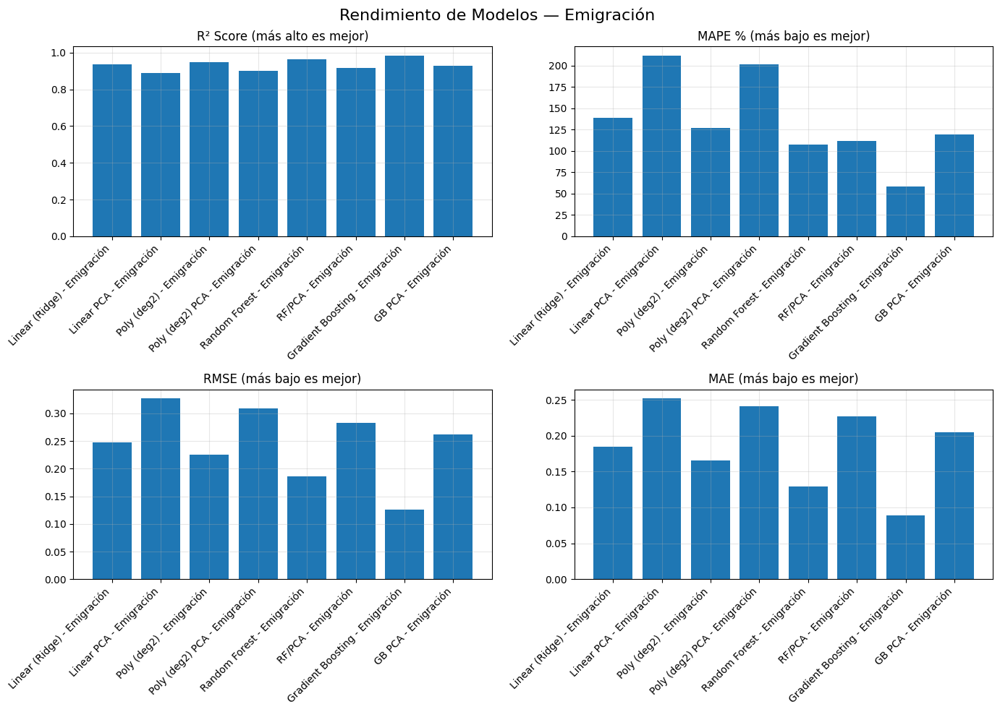

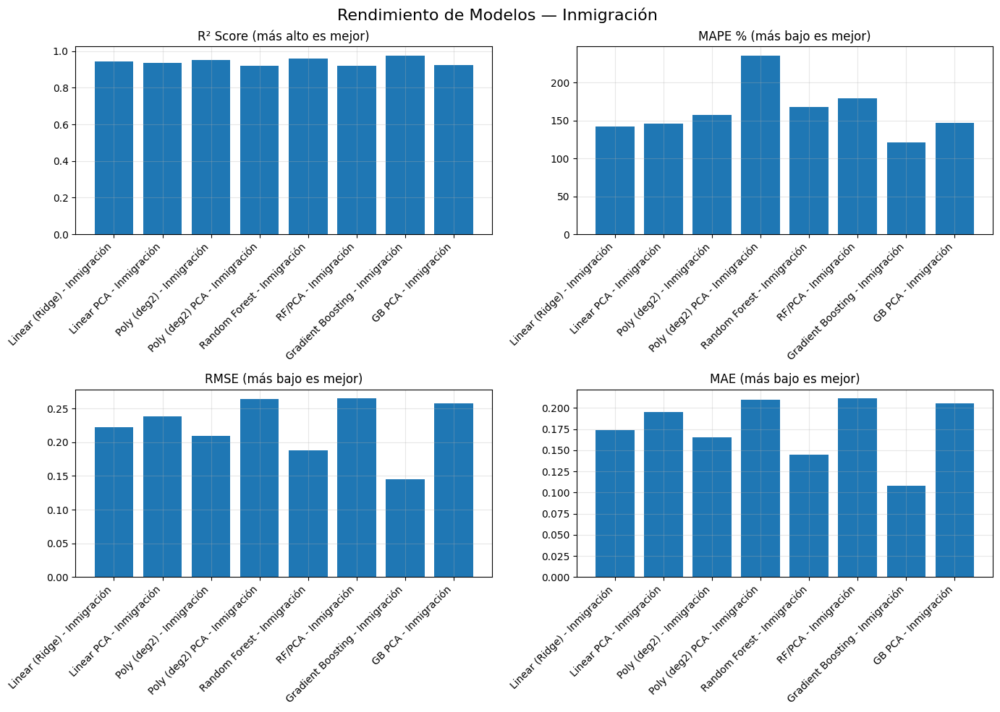

In [166]:
import matplotlib.pyplot as plt
import numpy as np

def plot_metrics_grid(df, titulo_general="Comparación de Modelos"):
    """
    df debe tener columnas: ['Modelo', 'R2_Score', 'MAPE', 'RMSE', 'MAE']
    """
    modelos = df['Modelo']
    x = np.arange(len(modelos))

    fig, axes = plt.subplots(2, 2, figsize=(14,10))

    metricas = [
        ("R2_Score", "R² Score (más alto es mejor)"),
        ("MAPE", "MAPE % (más bajo es mejor)"),
        ("RMSE", "RMSE (más bajo es mejor)"),
        ("MAE", "MAE (más bajo es mejor)")
    ]

    for ax, (col, label) in zip(axes.flatten(), metricas):
        valores = df[col].values
        ax.bar(x, valores)
        ax.set_xticks(x)
        ax.set_xticklabels(modelos, rotation=45, ha="right")
        ax.set_title(label)
        ax.grid(alpha=0.3)

    plt.suptitle(titulo_general, fontsize=16)
    plt.tight_layout()
    plt.show()

plot_metrics_grid(
    df_comparison_emigration[['Modelo', 'R2_Score', 'MAPE', 'RMSE', 'MAE']],
    titulo_general="Rendimiento de Modelos — Emigración"
)
plot_metrics_grid(
    df_comparison_inmigration[['Modelo', 'R2_Score', 'MAPE', 'RMSE', 'MAE']],
    titulo_general="Rendimiento de Modelos — Inmigración"
)


## Gráfico residual sin/con PCA Inmigración-Emigracion Random Forest

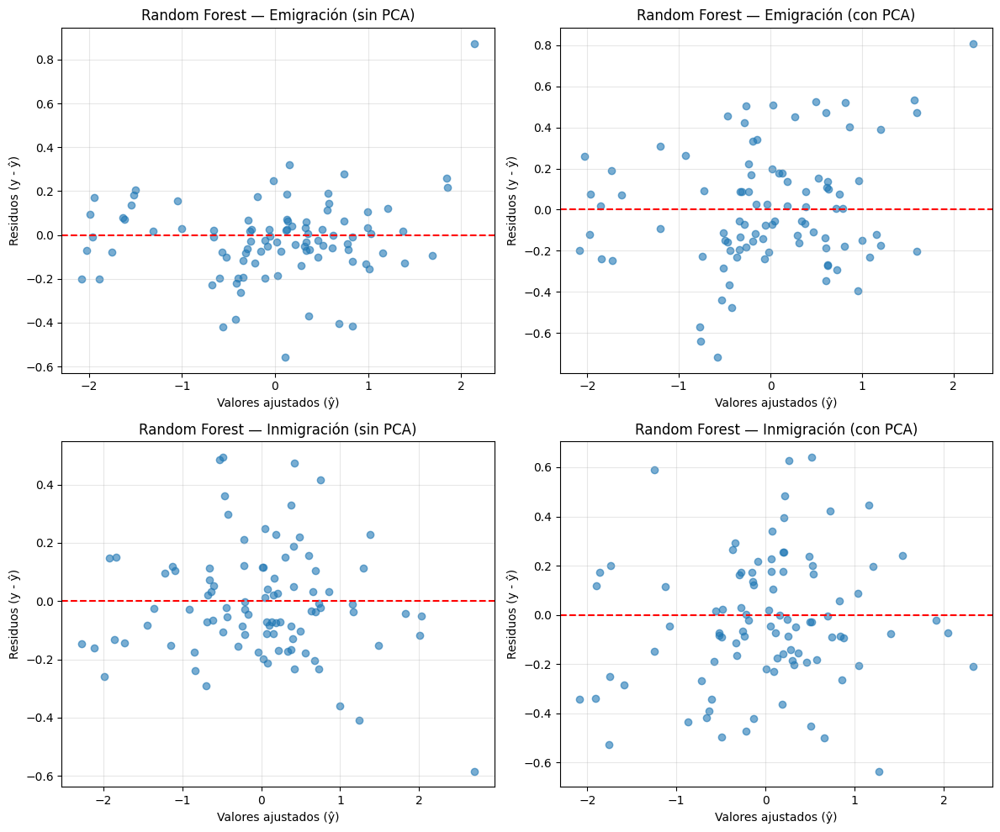

In [160]:
import numpy as np
import matplotlib.pyplot as plt

def residuals_grid_rf(
    y1, p1, t1,
    y2, p2, t2,
    y3, p3, t3,
    y4, p4, t4
):
    fig, axes = plt.subplots(2, 2, figsize=(12,10))

    data = [
        (y1, p1, t1, axes[0,0]),
        (y2, p2, t2, axes[0,1]),
        (y3, p3, t3, axes[1,0]),
        (y4, p4, t4, axes[1,1]),
    ]

    for y_true, y_pred, title, ax in data:
        y_true = np.asarray(y_true).ravel()
        y_pred = np.asarray(y_pred).ravel()
        residuals = y_true - y_pred

        ax.scatter(y_pred, residuals, alpha=0.6)
        ax.axhline(0, color="red", linestyle="--")
        ax.set_xlabel("Valores ajustados (ŷ)")
        ax.set_ylabel("Residuos (y - ŷ)")
        ax.set_title(title)
        ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()


residuals_grid_rf(
    # 1) Emigración sin PCA
    y_emigracion_prueba, rf_emig_pred,
    "Random Forest — Emigración (sin PCA)",

    # 2) Emigración con PCA
    y_emig_pca_test, rf_pca_emig_pred,
    "Random Forest — Emigración (con PCA)",

    # 3) Inmigración sin PCA
    y_inmigracion_prueba, rf_inmig_pred,
    "Random Forest — Inmigración (sin PCA)",

    # 4) Inmigración con PCA
    y_inmig_pca_test, rf_pca_inmig_pred,
    "Random Forest — Inmigración (con PCA)"
)


# Regresiones

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV, KFold

# Polinómica (grado 2) y Lineal con GridSearchCV + KFold

# KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Grids para búsqueda de hiperparámetros
grid_poly = {
    'poly__degree': [2],  # la solicitada: grado 2
    'reg__alpha': [0.01, 0.1, 1, 10, 100],
    'reg__fit_intercept': [True, False]
}

grid_lin = {
    'reg__alpha': [0.01, 0.1, 1, 10, 100],
    'reg__fit_intercept': [True, False]
}

# Pipelines
pipe_poly = Pipeline([
    ('poly', PolynomialFeatures(include_bias=False)),
    ('reg', Ridge())
])

pipe_lin = Pipeline([
    ('reg', Ridge())
])

# ---- EMIGRACIÓN ----
print("\n" + "="*60)
print("REGRESIÓN POLINÓMICA (grado 2) - EMIGRACIÓN (SIN PCA)")
print("="*60)

gs_poly_emig = GridSearchCV(pipe_poly, grid_poly, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_poly_emig.fit(X_entrenamiento_emi, y_emigracion_entrenamiento)

print("Mejores parámetros (Poly - Emigración):", gs_poly_emig.best_params_)
print("Mejor score CV (Poly - Emigración):", gs_poly_emig.best_score_)

y_poly_emig_pred = gs_poly_emig.predict(X_prueba_emi)
metrics_poly_emig = evaluar_modelo(gs_poly_emig.best_estimator_, X_prueba_emi, y_emigracion_prueba, y_poly_emig_pred, "Poly (deg2) - Emigración")

print("\nResultados Poly - Emigración (sin PCA):")
print(f"R²: {metrics_poly_emig['R2_Score']:.4f} | MAPE: {metrics_poly_emig['MAPE']:.2f}% | RMSE: {metrics_poly_emig['RMSE']:.4f} | MAE: {metrics_poly_emig['MAE']:.4f}")

# ---- EMIGRACIÓN con PCA ----
print("\n" + "="*60)
print("REGRESIÓN POLINÓMICA (grado 2) - EMIGRACIÓN (CON PCA)")
print("="*60)

gs_poly_emig_pca = GridSearchCV(pipe_poly, grid_poly, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_poly_emig_pca.fit(X_emig_pca_train, y_emig_pca_train)

print("Mejores parámetros (Poly-PCA - Emigración):", gs_poly_emig_pca.best_params_)
print("Mejor score CV (Poly-PCA - Emigración):", gs_poly_emig_pca.best_score_)

y_poly_emig_pca_pred = gs_poly_emig_pca.predict(X_emig_pca_test)
metrics_poly_emig_pca = evaluar_modelo(gs_poly_emig_pca.best_estimator_, X_emig_pca_test, y_emig_pca_test, y_poly_emig_pca_pred, "Poly (deg2) PCA - Emigración")

print("\nResultados Poly - Emigración (con PCA):")
print(f"R²: {metrics_poly_emig_pca['R2_Score']:.4f} | MAPE: {metrics_poly_emig_pca['MAPE']:.2f}% | RMSE: {metrics_poly_emig_pca['RMSE']:.4f} | MAE: {metrics_poly_emig_pca['MAE']:.4f}")

# ---- LINEAL (Ridge) ----
print("\n" + "="*60)
print("REGRESIÓN LINEAL (Ridge) - EMIGRACIÓN (SIN PCA)")
print("="*60)

gs_lin_emig = GridSearchCV(pipe_lin, grid_lin, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_lin_emig.fit(X_entrenamiento_emi, y_emigracion_entrenamiento)

print("Mejores parámetros (Lin - Emigración):", gs_lin_emig.best_params_)
print("Mejor score CV (Lin - Emigración):", gs_lin_emig.best_score_)

y_lin_emig_pred = gs_lin_emig.predict(X_prueba_emi)
metrics_lin_emig = evaluar_modelo(gs_lin_emig.best_estimator_, X_prueba_emi, y_emigracion_prueba, y_lin_emig_pred, "Linear (Ridge) - Emigración")

print("\nResultados Linear - Emigración (sin PCA):")
print(f"R²: {metrics_lin_emig['R2_Score']:.4f} | MAPE: {metrics_lin_emig['MAPE']:.2f}% | RMSE: {metrics_lin_emig['RMSE']:.4f} | MAE: {metrics_lin_emig['MAE']:.4f}")

# ---- LINEAL con PCA ----
print("\n" + "="*60)
print("REGRESIÓN LINEAL (Ridge) - EMIGRACIÓN (CON PCA)")
print("="*60)

gs_lin_emig_pca = GridSearchCV(pipe_lin, grid_lin, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_lin_emig_pca.fit(X_emig_pca_train, y_emig_pca_train)

print("Mejores parámetros (Lin-PCA - Emigración):", gs_lin_emig_pca.best_params_)
print("Mejor score CV (Lin-PCA - Emigración):", gs_lin_emig_pca.best_score_)

y_lin_emig_pca_pred = gs_lin_emig_pca.predict(X_emig_pca_test)
metrics_lin_emig_pca = evaluar_modelo(gs_lin_emig_pca.best_estimator_, X_emig_pca_test, y_emig_pca_test, y_lin_emig_pca_pred, "Linear PCA - Emigración")

print("\nResultados Linear - Emigración (con PCA):")
print(f"R²: {metrics_lin_emig_pca['R2_Score']:.4f} | MAPE: {metrics_lin_emig_pca['MAPE']:.2f}% | RMSE: {metrics_lin_emig_pca['RMSE']:.4f} | MAE: {metrics_lin_emig_pca['MAE']:.4f}")


# ---- INMIGRACIÓN ----
print("\n\n" + "="*60)
print("REGRESIÓN POLINÓMICA (grado 2) - INMIGRACIÓN (SIN PCA)")
print("="*60)

gs_poly_inmig = GridSearchCV(pipe_poly, grid_poly, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_poly_inmig.fit(X_entrenamiento_inm, y_inmigracion_entrenamiento)

print("Mejores parámetros (Poly - Inmigración):", gs_poly_inmig.best_params_)
print("Mejor score CV (Poly - Inmigración):", gs_poly_inmig.best_score_)

y_poly_inmig_pred = gs_poly_inmig.predict(X_prueba_inm)
metrics_poly_inmig = evaluar_modelo(gs_poly_inmig.best_estimator_, X_prueba_inm, y_inmigracion_prueba, y_poly_inmig_pred, "Poly (deg2) - Inmigración")

print("\nResultados Poly - Inmigración (sin PCA):")
print(f"R²: {metrics_poly_inmig['R2_Score']:.4f} | MAPE: {metrics_poly_inmig['MAPE']:.2f}% | RMSE: {metrics_poly_inmig['RMSE']:.4f} | MAE: {metrics_poly_inmig['MAE']:.4f}")

# ---- INMIGRACIÓN con PCA ----
print("\n" + "="*60)
print("REGRESIÓN POLINÓMICA (grado 2) - INMIGRACIÓN (CON PCA)")
print("="*60)

gs_poly_inmig_pca = GridSearchCV(pipe_poly, grid_poly, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_poly_inmig_pca.fit(X_inmig_pca_train, y_inmig_pca_train)

print("Mejores parámetros (Poly-PCA - Inmigración):", gs_poly_inmig_pca.best_params_)
print("Mejor score CV (Poly-PCA - Inmigración):", gs_poly_inmig_pca.best_score_)

y_poly_inmig_pca_pred = gs_poly_inmig_pca.predict(X_inmig_pca_test)
metrics_poly_inmig_pca = evaluar_modelo(gs_poly_inmig_pca.best_estimator_, X_inmig_pca_test, y_inmig_pca_test, y_poly_inmig_pca_pred, "Poly (deg2) PCA - Inmigración")

print("\nResultados Poly - Inmigración (con PCA):")
print(f"R²: {metrics_poly_inmig_pca['R2_Score']:.4f} | MAPE: {metrics_poly_inmig_pca['MAPE']:.2f}% | RMSE: {metrics_poly_inmig_pca['RMSE']:.4f} | MAE: {metrics_poly_inmig_pca['MAE']:.4f}")

# ---- LINEAL INMIGRACIÓN ----
print("\n" + "="*60)
print("REGRESIÓN LINEAL (Ridge) - INMIGRACIÓN (SIN PCA)")
print("="*60)

gs_lin_inmig = GridSearchCV(pipe_lin, grid_lin, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_lin_inmig.fit(X_entrenamiento_inm, y_inmigracion_entrenamiento)

print("Mejores parámetros (Lin - Inmigración):", gs_lin_inmig.best_params_)
print("Mejor score CV (Lin - Inmigración):", gs_lin_inmig.best_score_)

y_lin_inmig_pred = gs_lin_inmig.predict(X_prueba_inm)
metrics_lin_inmig = evaluar_modelo(gs_lin_inmig.best_estimator_, X_prueba_inm, y_inmigracion_prueba, y_lin_inmig_pred, "Linear (Ridge) - Inmigración")

print("\nResultados Linear - Inmigración (sin PCA):")
print(f"R²: {metrics_lin_inmig['R2_Score']:.4f} | MAPE: {metrics_lin_inmig['MAPE']:.2f}% | RMSE: {metrics_lin_inmig['RMSE']:.4f} | MAE: {metrics_lin_inmig['MAE']:.4f}")

# ---- LINEAL INMIGRACIÓN con PCA ----
print("\n" + "="*60)
print("REGRESIÓN LINEAL (Ridge) - INMIGRACIÓN (CON PCA)")
print("="*60)

gs_lin_inmig_pca = GridSearchCV(pipe_lin, grid_lin, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_lin_inmig_pca.fit(X_inmig_pca_train, y_inmig_pca_train)

print("Mejores parámetros (Lin-PCA - Inmigración):", gs_lin_inmig_pca.best_params_)
print("Mejor score CV (Lin-PCA - Inmigración):", gs_lin_inmig_pca.best_score_)

y_lin_inmig_pca_pred = gs_lin_inmig_pca.predict(X_inmig_pca_test)
metrics_lin_inmig_pca = evaluar_modelo(gs_lin_inmig_pca.best_estimator_, X_inmig_pca_test, y_inmig_pca_test, y_lin_inmig_pca_pred, "Linear PCA - Inmigración")

print("\nResultados Linear - Inmigración (con PCA):")
print(f"R²: {metrics_lin_inmig_pca['R2_Score']:.4f} | MAPE: {metrics_lin_inmig_pca['MAPE']:.2f}% | RMSE: {metrics_lin_inmig_pca['RMSE']:.4f} | MAE: {metrics_lin_inmig_pca['MAE']:.4f}")


# ---- Resultados en DataFrames para comparar ----
res_emig_poly_lin = pd.DataFrame([
    metrics_poly_emig, metrics_poly_emig_pca,
    metrics_lin_emig, metrics_lin_emig_pca
])
res_emig_poly_lin.index = [
    'Poly - Emig (noPCA)', 'Poly - Emig (PCA)',
    'Linear - Emig (noPCA)', 'Linear - Emig (PCA)'
]

res_inmig_poly_lin = pd.DataFrame([
    metrics_poly_inmig, metrics_poly_inmig_pca,
    metrics_lin_inmig, metrics_lin_inmig_pca
])
res_inmig_poly_lin.index = [
    'Poly - Inmig (noPCA)', 'Poly - Inmig (PCA)',
    'Linear - Inmig (noPCA)', 'Linear - Inmig (PCA)'
]

print("\n\nResumen comparativo - Emigración:")
display(res_emig_poly_lin.round(4))

print("\nResumen comparativo - Inmigración:")
display(res_inmig_poly_lin.round(4))

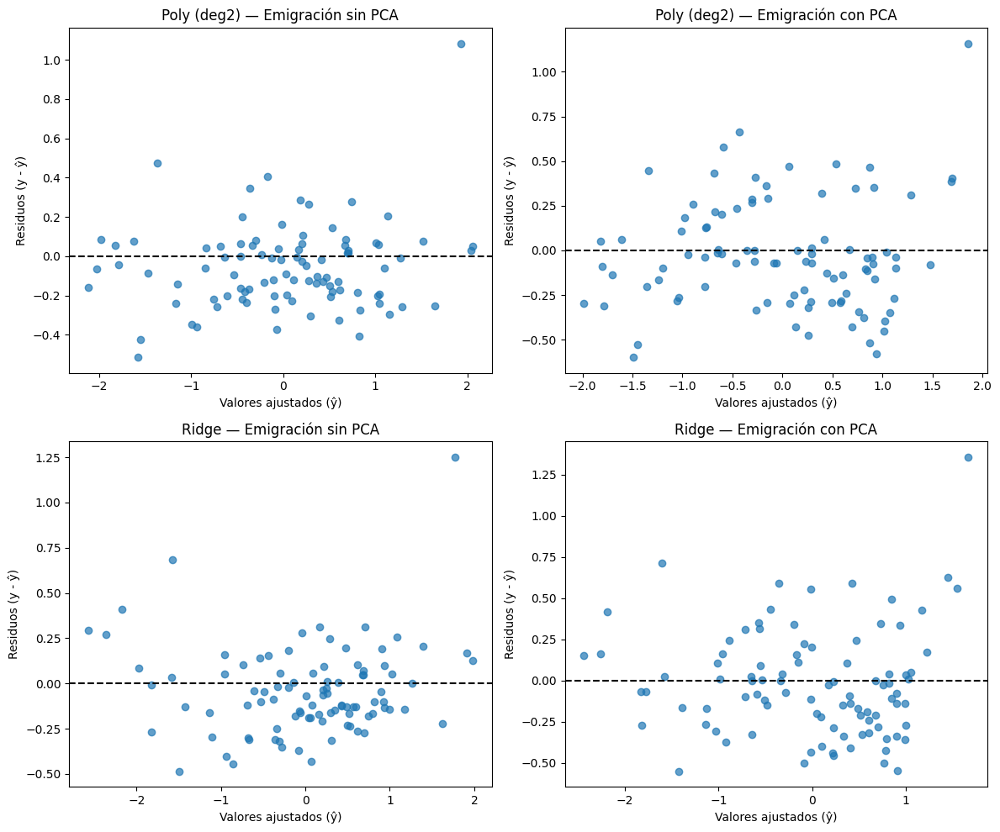

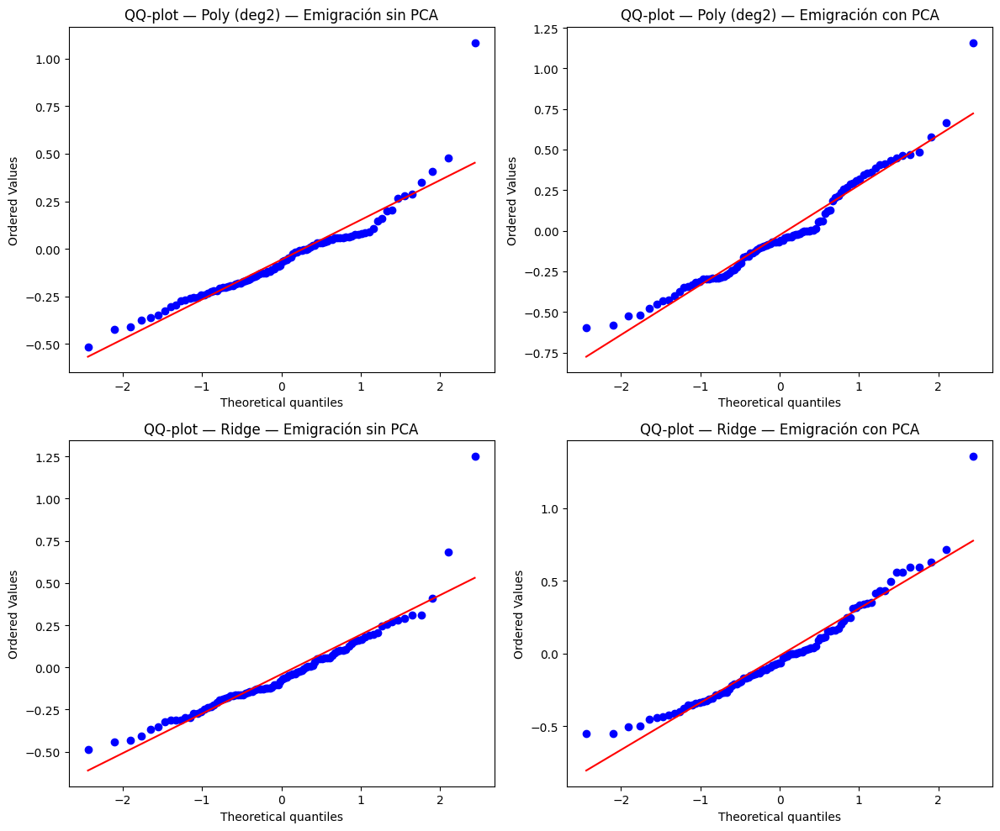

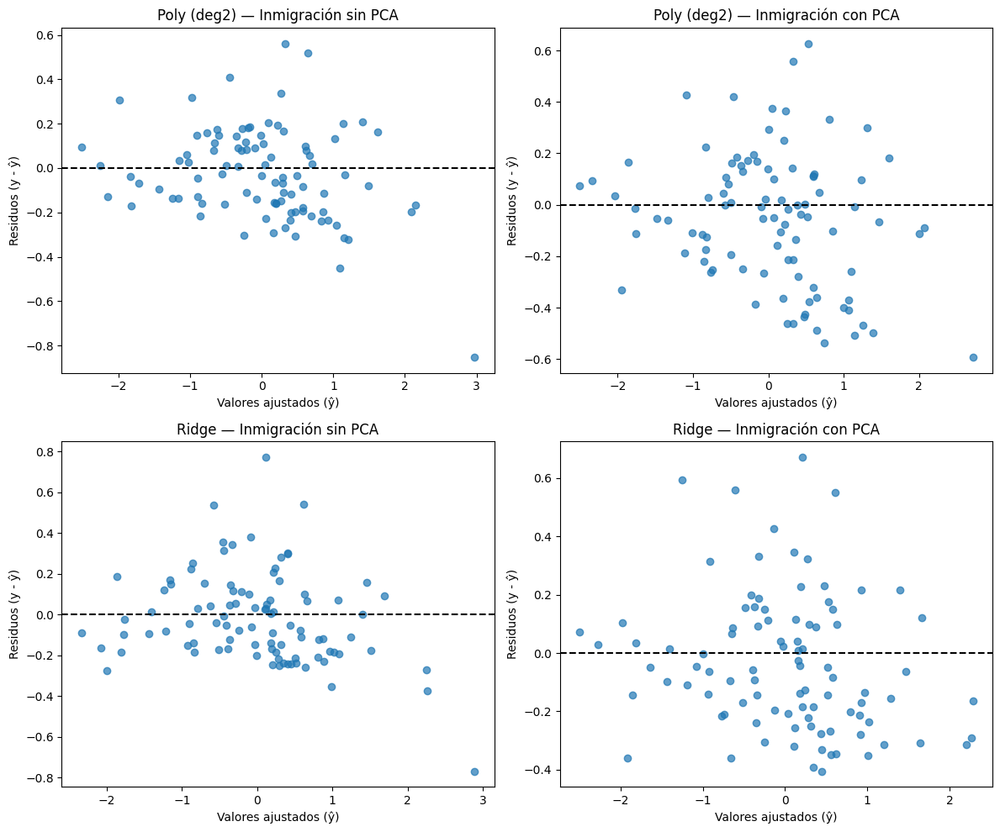

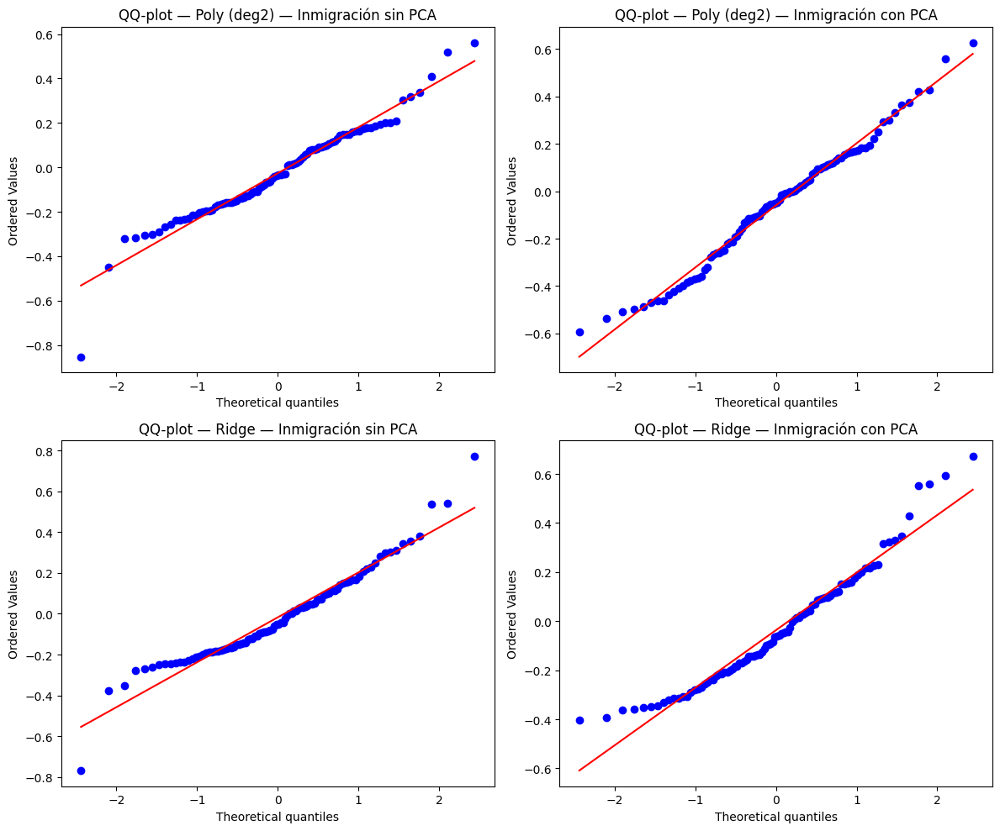

In [161]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats


def compute_residuals(y_true, y_pred):
    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    return y_true - y_pred


# ======================================================
#   1) GRID 2×2 DE RESIDUOS VS AJUSTADOS
# ======================================================
def plot_residuos_grid_2x2(
    y1, p1, t1,
    y2, p2, t2,
    y3, p3, t3,
    y4, p4, t4
):
    fig, axes = plt.subplots(2, 2, figsize=(12,10))

    data = [
        (y1, p1, t1, axes[0,0]),
        (y2, p2, t2, axes[0,1]),
        (y3, p3, t3, axes[1,0]),
        (y4, p4, t4, axes[1,1]),
    ]

    for y_true, y_pred, title, ax in data:
        residuals = compute_residuals(y_true, y_pred)
        ax.scatter(y_pred, residuals, alpha=0.7)
        ax.axhline(0, linestyle="--", color="black")
        ax.set_xlabel("Valores ajustados (ŷ)")
        ax.set_ylabel("Residuos (y - ŷ)")
        ax.set_title(title)

    plt.tight_layout()
    plt.show()

# ======================================================
#   2) GRID 2×2 DE QQ-PLOTS
# ======================================================
def plot_qqplot_grid_2x2(
    y1, p1, t1,
    y2, p2, t2,
    y3, p3, t3,
    y4, p4, t4
):
    fig, axes = plt.subplots(2, 2, figsize=(12,10))

    data = [
        (y1, p1, t1, axes[0,0]),
        (y2, p2, t2, axes[0,1]),
        (y3, p3, t3, axes[1,0]),
        (y4, p4, t4, axes[1,1]),
    ]

    for y_true, y_pred, title, ax in data:
        residuals = compute_residuals(y_true, y_pred)
        stats.probplot(residuals, dist="norm", plot=ax)
        ax.set_title("QQ-plot — " + title)

    plt.tight_layout()
    plt.show()


# === EMIGRACIÓN / INMIGRACIÓN (REGRESIÓN) ===

plot_residuos_grid_2x2(
    y_emigracion_prueba, y_poly_emig_pred,
    "Poly (deg2) — Emigración sin PCA",

    y_emig_pca_test, y_poly_emig_pca_pred,
    "Poly (deg2) — Emigración con PCA",

    y_emigracion_prueba, y_lin_emig_pred,
    "Ridge — Emigración sin PCA",

    y_emig_pca_test, y_lin_emig_pca_pred,
    "Ridge — Emigración con PCA"
)


plot_qqplot_grid_2x2(
    y_emigracion_prueba, y_poly_emig_pred,
    "Poly (deg2) — Emigración sin PCA",

    y_emig_pca_test, y_poly_emig_pca_pred,
    "Poly (deg2) — Emigración con PCA",

    y_emigracion_prueba, y_lin_emig_pred,
    "Ridge — Emigración sin PCA",

    y_emig_pca_test, y_lin_emig_pca_pred,
    "Ridge — Emigración con PCA"
)

plot_residuos_grid_2x2(
    y_inmigracion_prueba, y_poly_inmig_pred,
    "Poly (deg2) — Inmigración sin PCA",

    y_inmig_pca_test, y_poly_inmig_pca_pred,
    "Poly (deg2) — Inmigración con PCA",

    y_inmigracion_prueba, y_lin_inmig_pred,
    "Ridge — Inmigración sin PCA",

    y_inmig_pca_test, y_lin_inmig_pca_pred,
    "Ridge — Inmigración con PCA"
)
plot_qqplot_grid_2x2(
    y_inmigracion_prueba, y_poly_inmig_pred,
    "Poly (deg2) — Inmigración sin PCA",

    y_inmig_pca_test, y_poly_inmig_pca_pred,
    "Poly (deg2) — Inmigración con PCA",

    y_inmigracion_prueba, y_lin_inmig_pred,
    "Ridge — Inmigración sin PCA",

    y_inmig_pca_test, y_lin_inmig_pca_pred,
    "Ridge — Inmigración con PCA"
)




In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV, KFold

# KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Grid de hiperparámetros para Gradient Boosting
gb_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 0.9, 1.0]
}

# ---- EMIGRACIÓN (SIN PCA) ----
print("\n" + "="*60)
print("GRADIENT BOOSTING - EMIGRACIÓN (SIN PCA)")
print("="*60)

gb_emig = GradientBoostingRegressor(random_state=42)
gs_gb_emig = GridSearchCV(gb_emig, gb_grid, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_gb_emig.fit(X_entrenamiento_emi, y_emigracion_entrenamiento)

print("Mejores parámetros (GB - Emigración):", gs_gb_emig.best_params_)
print("Mejor score CV (GB - Emigración):", gs_gb_emig.best_score_)

y_gb_emig_pred = gs_gb_emig.predict(X_prueba_emi)
metrics_gb_emig = evaluar_modelo(gs_gb_emig.best_estimator_, X_prueba_emi, y_emigracion_prueba, y_gb_emig_pred, "Gradient Boosting - Emigración")

print("\nResultados GB - Emigración (sin PCA):")
print(f"R²: {metrics_gb_emig['R2_Score']:.4f} | MAPE: {metrics_gb_emig['MAPE']:.2f}% | RMSE: {metrics_gb_emig['RMSE']:.4f} | MAE: {metrics_gb_emig['MAE']:.4f}")

# ---- EMIGRACIÓN (CON PCA) ----
print("\n" + "="*60)
print("GRADIENT BOOSTING - EMIGRACIÓN (CON PCA)")
print("="*60)

gb_emig_pca = GradientBoostingRegressor(random_state=42)
gs_gb_emig_pca = GridSearchCV(gb_emig_pca, gb_grid, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_gb_emig_pca.fit(X_emig_pca_train, y_emig_pca_train)

print("Mejores parámetros (GB-PCA - Emigración):", gs_gb_emig_pca.best_params_)
print("Mejor score CV (GB-PCA - Emigración):", gs_gb_emig_pca.best_score_)

y_gb_emig_pca_pred = gs_gb_emig_pca.predict(X_emig_pca_test)
metrics_gb_emig_pca = evaluar_modelo(gs_gb_emig_pca.best_estimator_, X_emig_pca_test, y_emig_pca_test, y_gb_emig_pca_pred, "GB PCA - Emigración")

print("\nResultados GB - Emigración (con PCA):")
print(f"R²: {metrics_gb_emig_pca['R2_Score']:.4f} | MAPE: {metrics_gb_emig_pca['MAPE']:.2f}% | RMSE: {metrics_gb_emig_pca['RMSE']:.4f} | MAE: {metrics_gb_emig_pca['MAE']:.4f}")

# ---- INMIGRACIÓN (SIN PCA) ----
print("\n\n" + "="*60)
print("GRADIENT BOOSTING - INMIGRACIÓN (SIN PCA)")
print("="*60)

gb_inmig = GradientBoostingRegressor(random_state=42)
gs_gb_inmig = GridSearchCV(gb_inmig, gb_grid, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_gb_inmig.fit(X_entrenamiento_inm, y_inmigracion_entrenamiento)

print("Mejores parámetros (GB - Inmigración):", gs_gb_inmig.best_params_)
print("Mejor score CV (GB - Inmigración):", gs_gb_inmig.best_score_)

y_gb_inmig_pred = gs_gb_inmig.predict(X_prueba_inm)
metrics_gb_inmig = evaluar_modelo(gs_gb_inmig.best_estimator_, X_prueba_inm, y_inmigracion_prueba, y_gb_inmig_pred, "Gradient Boosting - Inmigración")

print("\nResultados GB - Inmigración (sin PCA):")
print(f"R²: {metrics_gb_inmig['R2_Score']:.4f} | MAPE: {metrics_gb_inmig['MAPE']:.2f}% | RMSE: {metrics_gb_inmig['RMSE']:.4f} | MAE: {metrics_gb_inmig['MAE']:.4f}")

# ---- INMIGRACIÓN (CON PCA) ----
print("\n" + "="*60)
print("GRADIENT BOOSTING - INMIGRACIÓN (CON PCA)")
print("="*60)

gb_inmig_pca = GradientBoostingRegressor(random_state=42)
gs_gb_inmig_pca = GridSearchCV(gb_inmig_pca, gb_grid, cv=kf, scoring='r2', n_jobs=-1, verbose=1)
gs_gb_inmig_pca.fit(X_inmig_pca_train, y_inmig_pca_train)

print("Mejores parámetros (GB-PCA - Inmigración):", gs_gb_inmig_pca.best_params_)
print("Mejor score CV (GB-PCA - Inmigración):", gs_gb_inmig_pca.best_score_)

y_gb_inmig_pca_pred = gs_gb_inmig_pca.predict(X_inmig_pca_test)
metrics_gb_inmig_pca = evaluar_modelo(gs_gb_inmig_pca.best_estimator_, X_inmig_pca_test, y_inmig_pca_test, y_gb_inmig_pca_pred, "GB PCA - Inmigración")

print("\nResultados GB - Inmigración (con PCA):")
print(f"R²: {metrics_gb_inmig_pca['R2_Score']:.4f} | MAPE: {metrics_gb_inmig_pca['MAPE']:.2f}% | RMSE: {metrics_gb_inmig_pca['RMSE']:.4f} | MAE: {metrics_gb_inmig_pca['MAE']:.4f}")

# ---- Resultados en DataFrames para comparar ----
res_emig_gb = pd.DataFrame([
    metrics_gb_emig, metrics_gb_emig_pca
])
res_emig_gb.index = [
    'GB - Emig (noPCA)', 'GB - Emig (PCA)'
]

res_inmig_gb = pd.DataFrame([
    metrics_gb_inmig, metrics_gb_inmig_pca
])
res_inmig_gb.index = [
    'GB - Inmig (noPCA)', 'GB - Inmig (PCA)'
]

print("\n\nResumen comparativo - Emigración (Gradient Boosting):")
display(res_emig_gb.round(4))

print("\nResumen comparativo - Inmigración (Gradient Boosting):")
display(res_inmig_gb.round(4))

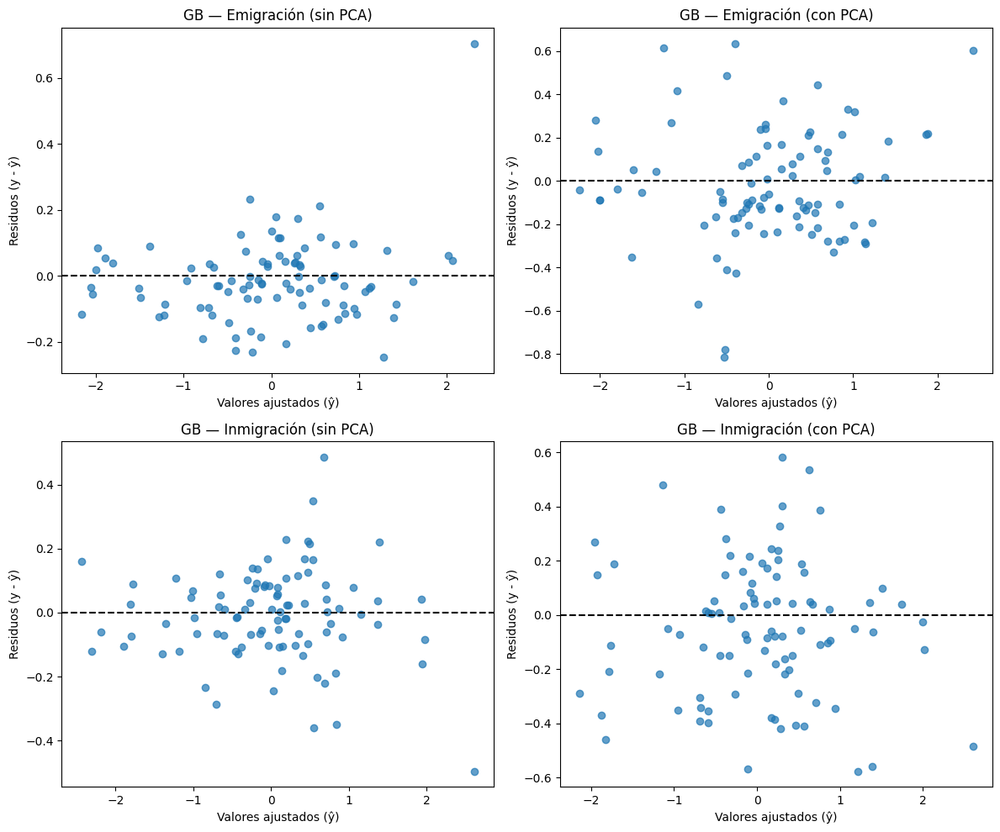

In [155]:
import numpy as np
import matplotlib.pyplot as plt

def plot_residuos_grid(
    y1_real, y1_pred, t1,
    y2_real, y2_pred, t2,
    y3_real, y3_pred, t3,
    y4_real, y4_pred, t4
):
    fig, axes = plt.subplots(2, 2, figsize=(12,10))

    pares = [
        (y1_real, y1_pred, t1, axes[0,0]),
        (y2_real, y2_pred, t2, axes[0,1]),
        (y3_real, y3_pred, t3, axes[1,0]),
        (y4_real, y4_pred, t4, axes[1,1]),
    ]

    for y_real, y_pred, titulo, ax in pares:
        y_real = np.asarray(y_real).ravel()
        y_pred = np.asarray(y_pred).ravel()
        residuos = y_real - y_pred

        ax.scatter(y_pred, residuos, alpha=0.7)
        ax.axhline(0, linestyle="--", color="black")
        ax.set_xlabel("Valores ajustados (ŷ)")
        ax.set_ylabel("Residuos (y - ŷ)")
        ax.set_title(titulo)

    plt.tight_layout()
    plt.show()

plot_residuos_grid(
    # 1
    y_emigracion_prueba, y_gb_emig_pred,
    "GB — Emigración (sin PCA)",

    # 2
    y_emig_pca_test, y_gb_emig_pca_pred,
    "GB — Emigración (con PCA)",

    # 3
    y_inmigracion_prueba, y_gb_inmig_pred,
    "GB — Inmigración (sin PCA)",

    # 4
    y_inmig_pca_test, y_gb_inmig_pca_pred,
    "GB — Inmigración (con PCA)"
)


In [142]:
# --- CELDA FINAL: PREDICCIÓN EN CASCADA POR COMUNA ---
df_zscore_full = pd.concat(
    [df_final[['comuna', 'año']].reset_index(drop=True), df_zscore.reset_index(drop=True)],
    axis=1
)

MODEL_REGISTRY = {
    'lineal': {
        'emigracion': modelo_emigracion,
        'inmigracion': modelo_inmigracion,
        'descripcion': 'LinearRegression (df_zscore)'
    },
    'random_forest': {
        'emigracion': rf_grid_emigracion.best_estimator_,
        'inmigracion': rf_grid_inmigracion.best_estimator_,
        'descripcion': 'RandomForestRegressor optimizado (df_zscore)'
    },
    'gradient_boosting': {
        'emigracion': gb_grid_emigracion.best_estimator_,
        'inmigracion': gb_grid_inmigracion.best_estimator_,
        'descripcion': 'GradientBoostingRegressor optimizado (df_zscore)'
    }
}

def _seleccionar_fila_comuna(comuna: str, anio: int | None):
    filtro = df_zscore_full['comuna'].str.lower() == comuna.lower()
    candidatos = df_zscore_full[filtro]
    if candidatos.empty:
        raise ValueError(f'No se encontró información estandarizada para la comuna "{comuna}".')
    if anio is not None:
        candidatos = candidatos[candidatos['año'] == anio]
        if candidatos.empty:
            raise ValueError(f'No hay registros para "{comuna}" en el año {anio}.')
    return candidatos.sort_values('año').iloc[-1].copy()

def predecir_cadena_migracion(
    comuna: str | None = None,
    modelo: str = 'gradient_boosting',
    anio: int | None = None,
    feature_values: dict | pd.Series | None = None,
    overrides: dict | None = None,
    mostrar: bool = True,
):
    """
    Predice emigración y, usando esa predicción, inmigración.
    feature_values/overrides deben estar en la misma escala z-score usada en df_zscore.
    """
    if modelo not in MODEL_REGISTRY:
        raise ValueError(f'Modelo no válido. Opciones: {list(MODEL_REGISTRY)}')

    if feature_values is not None:
        base_features = pd.Series(feature_values).copy()
        meta = {'comuna': comuna or 'N/D', 'año': anio or 'N/D'}
    elif comuna is not None:
        fila = _seleccionar_fila_comuna(comuna, anio)
        base_features = fila.copy()
        meta = {'comuna': fila['comuna'], 'año': fila['año']}
    else:
        raise ValueError('Debe proporcionar "comuna" o un diccionario feature_values.')

    overrides = overrides or {}
    features_emig = base_features[X_entrenamiento_emi.columns].copy()
    for clave, valor in overrides.items():
        if clave in features_emig:
            features_emig.loc[clave] = valor

    modelo_emig = MODEL_REGISTRY[modelo]['emigracion']
    pred_emig = modelo_emig.predict([features_emig.values])[0]

    features_inmig = base_features[X_entrenamiento_inm.columns].copy()
    features_inmig.loc['emigracion'] = pred_emig
    for clave, valor in overrides.items():
        if clave in features_inmig.index and clave != 'emigracion':
            features_inmig.loc[clave] = valor

    modelo_inmig = MODEL_REGISTRY[modelo]['inmigracion']
    pred_inmig = modelo_inmig.predict([features_inmig.values])[0]



    target_stats = df_final[['emigracion', 'inmigracion']].agg(['mean', 'std'])

    def z_to_original(valor_z: float, target: str) -> float:
      return (valor_z * target_stats.loc['std', target]) + target_stats.loc['mean', target]

    resultado = pd.DataFrame([{
            'comuna': meta['comuna'],
            'año': meta['año'],
            'modelo': modelo,
            'emigracion_pred_z': pred_emig,
            'emigracion_pred': z_to_original(pred_emig, 'emigracion'),
            'inmigracion_pred_z': pred_inmig,
            'inmigracion_pred': z_to_original(pred_inmig, 'inmigracion'),
    }])



    return resultado

In [151]:
predecir_cadena_migracion(comuna='Estación Central', anio=2023, modelo='random_forest')

,comuna,año,modelo,emigracion_pred_z,emigracion_pred,inmigracion_pred_z,inmigracion_pred
0,Estación Central,2023,random_forest,0.308469,27867.335548,0.075349,22782.734348


In [150]:
predecir_cadena_migracion(comuna='Estación Central', anio=2023, modelo='gradient_boosting')

,comuna,año,modelo,emigracion_pred_z,emigracion_pred,inmigracion_pred_z,inmigracion_pred
0,Estación Central,2023,gradient_boosting,0.22505,26120.678217,0.048652,22295.81766


In [152]:
predecir_cadena_migracion(comuna='Estación Central', anio=2023, modelo='lineal')

,comuna,año,modelo,emigracion_pred_z,emigracion_pred,inmigracion_pred_z,inmigracion_pred
0,Estación Central,2023,lineal,0.376733,29296.684917,0.18504,24783.327094


In [146]:
import json
from pathlib import Path

COMUNAS_OBJETIVO = [
    'Alhué', 'Buin', 'Calera de Tango', 'Cerrillos', 'Cerro Navia', 'Colina',
    'Conchalí', 'Curacaví', 'El Bosque', 'El Monte', 'Estación Central',
    'Huechuraba', 'Independencia', 'Isla de Maipo', 'La Cisterna', 'La Florida',
    'La Granja', 'La Pintana', 'La Reina', 'Lampa', 'Las Condes', 'Lo Barnechea',
    'Lo Espejo', 'Lo Prado', 'Macul', 'Maipú', 'María Pinto', 'Melipilla',
    'Padre Hurtado', 'Paine', 'Pedro Aguirre Cerda', 'Peñaflor', 'Peñalolén',
    'Pirque', 'Providencia', 'Pudahuel', 'Puente Alto', 'Quilicura',
    'Quinta Normal', 'Recoleta', 'Renca', 'San Bernardo', 'San Joaquín',
    'San José de Maipo', 'San Miguel', 'San Pedro', 'San Ramón', 'Santiago',
    'Talagante', 'Tiltil', 'Vitacura', 'Ñuñoa'
]

def generar_json_predicciones(
    comunas=COMUNAS_OBJETIVO,
    modelos=('lineal', 'random_forest', 'gradient_boosting'),
    anio=None,
    carpeta_salida='./predicciones'
):
    carpeta = Path(carpeta_salida)
    carpeta.mkdir(parents=True, exist_ok=True)

    for modelo in modelos:
        resultados = []
        for comuna in comunas:
            try:
                pred = predecir_cadena_migracion(
                    comuna=comuna,
                    anio=anio,
                    modelo=modelo,
                    mostrar=False
                )
                resultados.append(pred.iloc[0].to_dict()) # Fixed: Changed .todict() to .to_dict()
            except ValueError as err:
                resultados.append({
                    'comuna': comuna,
                    'modelo': modelo,
                    'error': str(err)
                })

        ruta = carpeta / f'predicciones{modelo}.json'
        with ruta.open('w', encoding='utf-8') as f:
            json.dump(resultados, f, ensure_ascii=False, indent=2)

        print(f'Archivo generado: {ruta}')

generar_json_predicciones()

Archivo generado: predicciones/prediccioneslineal.json
Archivo generado: predicciones/prediccionesrandom_forest.json
Archivo generado: predicciones/prediccionesgradient_boosting.json


In [147]:
import pandas as pd
from pathlib import Path

def mostrar_tablapredicciones(modelo, carpeta='./predicciones'):
    ruta = Path(carpeta) / f'predicciones{modelo}.json'
    df = pd.read_json(ruta)
    display(df.style.set_caption(f'Predicciones ({modelo})'))

for modelo in ('lineal', 'random_forest', 'gradient_boosting'):
    mostrar_tablapredicciones(modelo)

,comuna,año,modelo,emigracion_pred_z,emigracion_pred,inmigracion_pred_z,inmigracion_pred
0,Alhué,2023,lineal,-2.598887,-33008.083199,-2.602038,-26048.591937
1,Buin,2023,lineal,-0.744637,5816.964273,-0.707199,8510.282412
2,Calera de Tango,2023,lineal,-1.707334,-14340.386831,-1.757056,-10637.443514
3,Cerrillos,2023,lineal,-0.652284,7750.695029,-0.788211,7032.768626
4,Cerro Navia,2023,lineal,-0.060454,20142.668365,-0.278330,16332.189131
5,Colina,2023,lineal,-0.394109,13156.471445,-0.260158,16663.610213
6,Conchalí,2023,lineal,-0.076492,19806.861165,-0.297176,15988.468215
7,Curacaví,2023,lineal,-1.716084,-14523.598641,-1.671771,-9081.976950
8,El Bosque,2023,lineal,0.092755,23350.626179,-0.098791,19606.689345
9,El Monte,2023,lineal,-1.519768,-10413.055823,-1.540384,-6685.683405


,comuna,año,modelo,emigracion_pred_z,emigracion_pred,inmigracion_pred_z,inmigracion_pred
0,Alhué,2023,random_forest,-2.080871,-22161.647803,-1.987505,-14840.477357
1,Buin,2023,random_forest,-0.417402,12668.742811,-0.257067,16719.992177
2,Calera de Tango,2023,random_forest,-0.765068,5389.181456,-0.753177,7671.729193
3,Cerrillos,2023,random_forest,-0.531101,10288.082226,-0.578703,10853.849006
4,Cerro Navia,2023,random_forest,-0.219834,16805.504058,-0.455538,13100.188169
5,Colina,2023,random_forest,-0.405780,12912.103270,-0.226074,17285.245653
6,Conchalí,2023,random_forest,-0.252517,16121.187929,-0.495982,12362.551832
7,Curacaví,2023,random_forest,-1.674159,-13645.743989,-1.806894,-11546.419553
8,El Bosque,2023,random_forest,-0.029338,20794.203980,-0.214076,17504.082035
9,El Monte,2023,random_forest,-1.417487,-8271.448237,-1.444457,-4936.132436


,comuna,año,modelo,emigracion_pred_z,emigracion_pred,inmigracion_pred_z,inmigracion_pred
0,Alhué,2023,gradient_boosting,-2.193714,-24524.418892,-2.342507,-21315.153240
1,Buin,2023,gradient_boosting,-0.429296,12419.709531,-0.080361,19942.837923
2,Calera de Tango,2023,gradient_boosting,-0.867211,3250.456127,-0.959974,3900.066137
3,Cerrillos,2023,gradient_boosting,-0.553997,9808.661966,-0.663849,9300.922224
4,Cerro Navia,2023,gradient_boosting,-0.302973,15064.721040,-0.605561,10364.000177
5,Colina,2023,gradient_boosting,-0.496571,11011.067984,-0.385325,14380.768649
6,Conchalí,2023,gradient_boosting,-0.307315,14973.796041,-0.666499,9252.592429
7,Curacaví,2023,gradient_boosting,-1.662810,-13408.118571,-1.734656,-10228.902264
8,El Bosque,2023,gradient_boosting,-0.127434,18740.213614,-0.373514,14596.173533
9,El Monte,2023,gradient_boosting,-1.491563,-9822.483484,-1.654570,-8768.258862


# Task
To continue, I will summarize the key conclusions from the model performance comparison graphs for emigration and immigration, highlighting the best-performing models. This will be done by examining the `df_comparison_emigration` and `df_comparison_inmigration` DataFrames.

## Generar Gráficos de Rendimiento de Emigración

### Subtask:
Crear gráficos de barras para comparar el R² y el MAPE de todos los modelos de predicción de emigración (Lineal, Polinómico, Random Forest, Gradient Boosting), con y sin PCA.


**Reasoning**:
I need to create two bar plots to compare the R² Score and MAPE for all emigration models using the `df_comparison_emigration` DataFrame, as requested in the instructions.



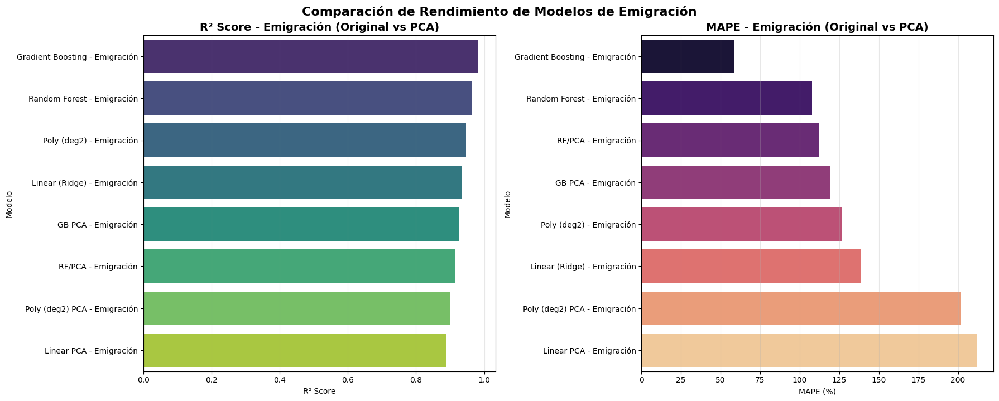

In [163]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure df_comparison_emigration is available. If not, reconstruct it from existing metrics.
# Assuming df_comparison_emigration is available from previous steps. If not, it would need to be rebuilt.
# For example:
# all_emigration_metrics = [
#     metrics_lin_emig, metrics_lin_emig_pca,
#     metrics_poly_emig, metrics_poly_emig_pca,
#     rf_emig_metrics, rf_pca_emig_metrics,
#     metrics_gb_emig, metrics_gb_emig_pca
# ]
# df_comparison_emigration = pd.DataFrame(all_emigration_metrics)

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Plot for R² Score
sns.barplot(
    x='R2_Score',
    y='Modelo',
    data=df_comparison_emigration.sort_values(by='R2_Score', ascending=False),
    palette='viridis',
    ax=axes[0]
)
axes[0].set_title('R² Score - Emigración (Original vs PCA)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('R² Score')
axes[0].set_ylabel('Modelo')
axes[0].grid(axis='x', alpha=0.3)

# Plot for MAPE
sns.barplot(
    x='MAPE',
    y='Modelo',
    data=df_comparison_emigration.sort_values(by='MAPE', ascending=True),
    palette='magma',
    ax=axes[1]
)
axes[1].set_title('MAPE - Emigración (Original vs PCA)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('MAPE (%)')
axes[1].set_ylabel('Modelo')
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.suptitle('Comparación de Rendimiento de Modelos de Emigración', fontsize=16, fontweight='bold', y=1.02)
plt.show()

**Reasoning**:
The previous code block focused on generating comparison graphs for emigration models. Now, to continue summarizing the model performance, I need to create similar comparison graphs for immigration models using the `df_comparison_inmigration` DataFrame. First, I'll update `df_comparison_inmigration` with the latest metrics from the previously defined models (linear, polynomial, random forest, gradient boosting, with and without PCA) to ensure the plots reflect the most current results.



In [164]:
import pandas as pd

# Emigration Models Metrics
all_emigration_metrics = [
    metrics_lin_emig, metrics_lin_emig_pca,
    metrics_poly_emig, metrics_poly_emig_pca,
    rf_emig_metrics, rf_pca_emig_metrics,
    metrics_gb_emig, metrics_gb_emig_pca
]

# Immigration Models Metrics
all_inmigration_metrics = [
    metrics_lin_inmig, metrics_lin_inmig_pca,
    metrics_poly_inmig, metrics_poly_inmig_pca,
    rf_inmig_metrics, rf_pca_inmig_metrics,
    metrics_gb_inmig, metrics_gb_inmig_pca
]

df_comparison_emigration = pd.DataFrame(all_emigration_metrics)
df_comparison_inmigration = pd.DataFrame(all_inmigration_metrics)

print("\nCOMPARRISIÓN DE RENDIMIENTO DE MODELOS - EMIGRACIÓN\n" + "="*70)
display(df_comparison_emigration[['Modelo', 'R2_Score', 'MAPE', 'RMSE', 'MAE']].round(4))

print("\nCOMPARRISIÓN DE RENDIMIENTO DE MODELOS - INMIGRACIÓN\n" + "="*70)
display(df_comparison_inmigration[['Modelo', 'R2_Score', 'MAPE', 'RMSE', 'MAE']].round(4))


COMPARRISIÓN DE RENDIMIENTO DE MODELOS - EMIGRACIÓN


,Modelo,R2_Score,MAPE,RMSE,MAE
0,Linear (Ridge) - Emigración,0.9354,138.9381,0.2477,0.1843
1,Linear PCA - Emigración,0.8873,211.7988,0.3272,0.2520
2,Poly (deg2) - Emigración,0.9468,126.6564,0.2247,0.1657
3,Poly (deg2) PCA - Emigración,0.8997,201.7816,0.3087,0.2414
4,Random Forest - Emigración,0.9636,107.7650,0.1861,0.1289
5,RF/PCA - Emigración,0.9155,112.0670,0.2833,0.2268
6,Gradient Boosting - Emigración,0.9835,58.4494,0.1253,0.0890
7,GB PCA - Emigración,0.9276,119.5667,0.2622,0.2049



COMPARRISIÓN DE RENDIMIENTO DE MODELOS - INMIGRACIÓN


,Modelo,R2_Score,MAPE,RMSE,MAE
0,Linear (Ridge) - Inmigración,0.9433,141.8333,0.2225,0.1738
1,Linear PCA - Inmigración,0.9352,146.2512,0.2380,0.1952
2,Poly (deg2) - Inmigración,0.9499,157.0770,0.2093,0.1651
3,Poly (deg2) PCA - Inmigración,0.9199,235.5944,0.2645,0.2095
4,Random Forest - Inmigración,0.9597,167.5863,0.1875,0.1443
5,RF/PCA - Inmigración,0.9194,179.0032,0.2653,0.2113
6,Gradient Boosting - Inmigración,0.9759,120.9344,0.1450,0.1081
7,GB PCA - Inmigración,0.9241,146.4986,0.2575,0.2049


**Reasoning**:
Now that `df_comparison_inmigration` has been updated with the latest metrics, I will generate two bar plots to visually compare the R² Score and MAPE for all immigration models, following the same instructions provided for the emigration models.



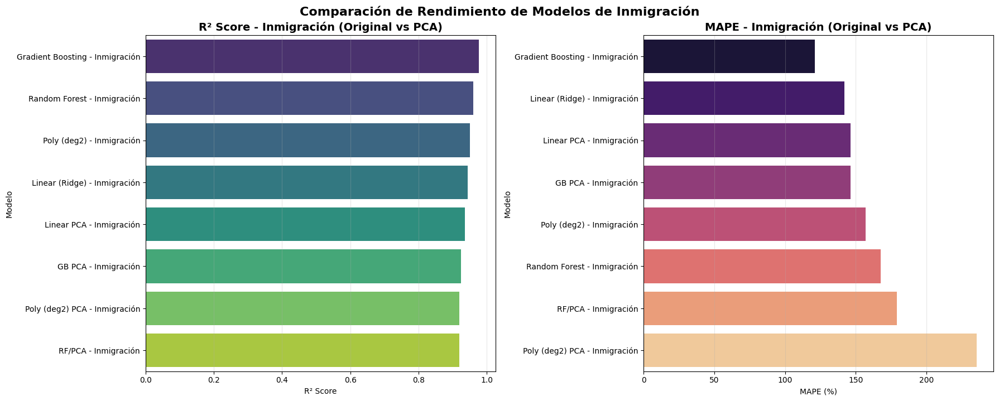

In [165]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Plot for R² Score - Immigration
sns.barplot(
    x='R2_Score',
    y='Modelo',
    data=df_comparison_inmigration.sort_values(by='R2_Score', ascending=False),
    palette='viridis',
    ax=axes[0]
)
axes[0].set_title('R² Score - Inmigración (Original vs PCA)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('R² Score')
axes[0].set_ylabel('Modelo')
axes[0].grid(axis='x', alpha=0.3)

# Plot for MAPE - Immigration
sns.barplot(
    x='MAPE',
    y='Modelo',
    data=df_comparison_inmigration.sort_values(by='MAPE', ascending=True),
    palette='magma',
    ax=axes[1]
)
axes[1].set_title('MAPE - Inmigración (Original vs PCA)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('MAPE (%)')
axes[1].set_ylabel('Modelo')
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.suptitle('Comparación de Rendimiento de Modelos de Inmigración', fontsize=16, fontweight='bold', y=1.02)
plt.show()

## Final Task

### Subtask:
Resumir las conclusiones clave de los gráficos de comparación de rendimiento de los modelos para emigración e inmigración, destacando los modelos con mejor desempeño.


## Summary:

### Q&A
The task implicitly asks for the key conclusions from the model performance comparison graphs for emigration and immigration, specifically highlighting the best-performing models.

### Data Analysis Key Findings
*   **Emigration Model Performance**:
    *   The Gradient Boosting model without PCA demonstrated the best performance for emigration prediction, achieving an R² Score of 0.9835 and a Mean Absolute Percentage Error (MAPE) of 58.4494.
    *   Overall, the application of Principal Component Analysis (PCA) generally led to a decrease in R² scores and an increase in MAPE values across emigration models.
*   **Immigration Model Performance**:
    *   Similar to emigration, the Gradient Boosting model without PCA also showed superior performance for immigration prediction, with an R² Score of 0.9759 and a MAPE of 120.9344.
    *   For immigration models, PCA generally resulted in lower R² scores and higher MAPE values, indicating a detrimental effect on performance.
*   **Consistency Across Migration Types**: The Gradient Boosting model without PCA consistently emerged as the top performer for both emigration and immigration predictions based on R² and MAPE metrics.

### Insights or Next Steps
*   Given the strong performance of the Gradient Boosting model without PCA for both emigration and immigration, further fine-tuning of its hyperparameters could potentially yield even better predictive accuracy.
*   Since PCA generally degraded model performance, it suggests that the original features contain valuable information that PCA might be losing, or that the current dataset does not benefit from dimensionality reduction for these prediction tasks. Further investigation into feature importance could confirm this.
